In [1]:
import custom_functions_scviEnv as cf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.stats as stats
import seaborn as sns
import warnings
from custom_functions_scviEnv import proportion_plot
from matplotlib.colors import ListedColormap
from matplotlib.colors import LinearSegmentedColormap

sc.set_figure_params(scanpy=True, dpi=80, dpi_save=150, frameon=True, vector_friendly=True, 
                     fontsize=14, figsize=None, color_map=None, format='png', facecolor=None, 
                     transparent=False, ipython_format='png2x')

In [2]:
warnings.filterwarnings("ignore")

## Loading Data

In [3]:
adata = sc.read_h5ad('../data/taPVAT_combined_annotated_with_immune_fibro_ecs.h5ad')

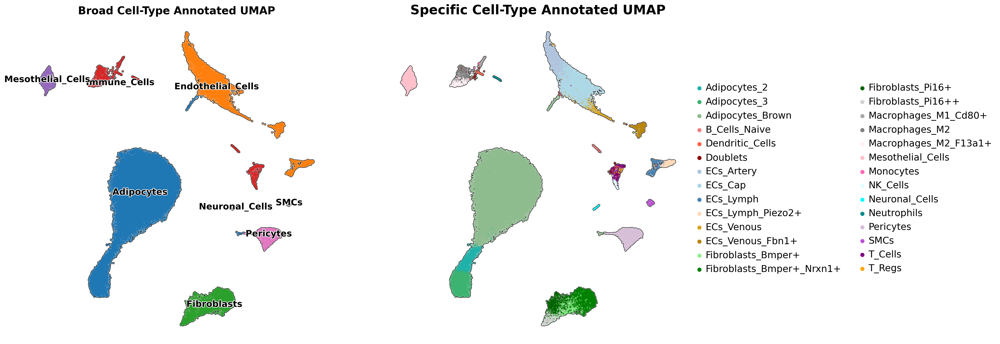

In [4]:
###Plotting single graph of all cells
fig = plt.figure(figsize = (20,10))
widths = [1, 1]

gs = fig.add_gridspec(ncols=2, nrows=1, width_ratios=widths)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
    
sc.pl.umap(adata, ax = ax1, color='celltype_broad', add_outline=True, size = 20, 
        legend_loc='on data', legend_fontsize=15, legend_fontoutline=2,frameon=False,
        title='', palette = cf.bright_palette, show = False)

sc.pl.umap(adata, ax = ax2, color='celltype', add_outline=True, size = 20, 
        legend_loc='right margin', legend_fontsize=16, legend_fontoutline=2,frameon=False,
        title='', palette = cf.large_palette, show = False)

ax1.set_title('Broad Cell-Type Annotated UMAP', fontsize=18, fontweight = 'bold')
ax2.set_title('Specific Cell-Type Annotated UMAP', fontsize=22, fontweight = 'bold')

plt.show()

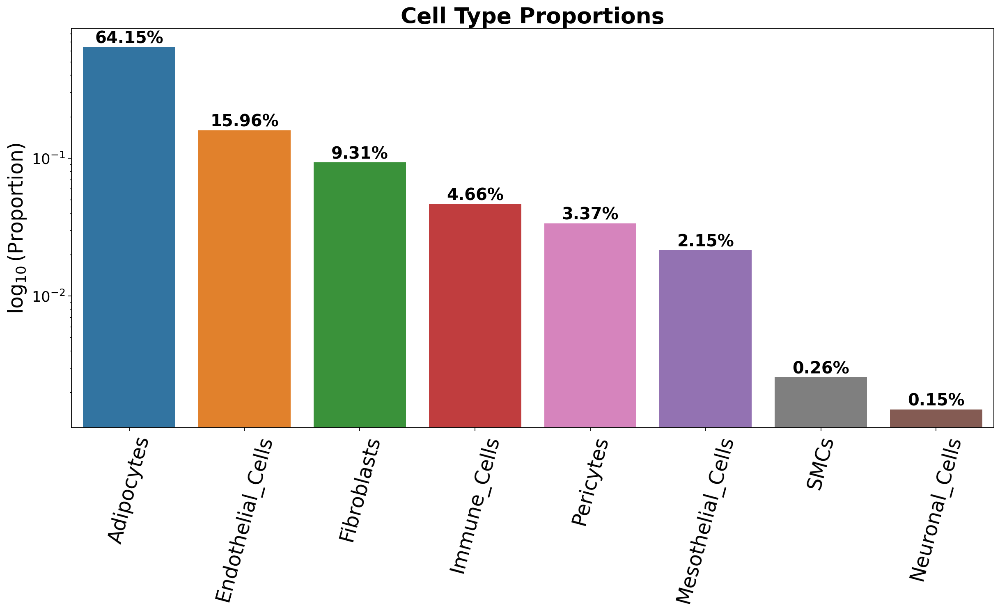

In [13]:
### High-level cell type proportions plot using the same colors as the UMAP.
list = ['Adipocytes', 'Endothelial_Cells', 'Fibroblasts', 'Immune_Cells', 'Mesothelial_Cells', 'Neuronal_Cells', 'Pericytes', 'SMCs']
color = dict(zip(list, adata.uns['celltype_broad_colors']))

# Adjust font sizes
plt.rcParams.update({'font.size': 16,   # Increase font size for tick labels, axis labels, and legend
                     'axes.titlesize': 24,  # Increase font size for title
                     'axes.labelsize': 20,  # Increase font size for axis labels
                     'xtick.labelsize': 20, # Increase font size for x-axis tick labels
                     'ytick.labelsize': 16})# Increase font size for y-axis tick labels
# Get the colors used in the UMAP plot
umap_colors = adata.uns['celltype_broad_colors']

fig, ax = plt.subplots(figsize = (18,8))

N = len(adata)
j = 0
props_dict = {"Cell Type":[], "Proportion":[], "Color":[]}
for i in np.unique(adata.obs.celltype_broad):
    i_len = len(adata[adata.obs.celltype_broad == i])
    props_dict["Cell Type"].append(i)
    props_dict["Proportion"].append(i_len/N)
    props_dict["Color"].append(umap_colors[j])  # Map the exact color used in the UMAP plot
    j+=1
props_df = pd.DataFrame(props_dict)

sns.barplot(x = "Cell Type", y = "Proportion", ax = ax, data = props_df, log = True, palette=color,
            order = props_df.sort_values("Proportion", ascending = False)["Cell Type"])
plt.xticks(rotation = 75, fontsize = 22)
plt.xlabel('')
plt.ylabel(r'$\log_{10}(\mathrm{Proportion})$', fontsize=22)
#plt.ylabel("log10(Proportion)")
plt.title('Cell Type Proportions', fontweight = 'bold')  # Add title
ax.grid(False)

# After plotting
bars = ax.patches

for bar, proportion in zip(bars, props_df.sort_values("Proportion", ascending=False)["Proportion"]):
    # Get bar position
    x = bar.get_x() + bar.get_width() / 2
    y = bar.get_height()
    
    # Label with the *original* proportion (not log)
    ax.text(x, y, f"{proportion:.2%}",  # format as percent with 2 decimals
            ha='center', va='bottom', fontsize=18, weight = 'bold', rotation=0)

#plt.savefig('../output/taPVAT_high_level_proportions_labeled.png', bbox_inches = "tight")
plt.show()


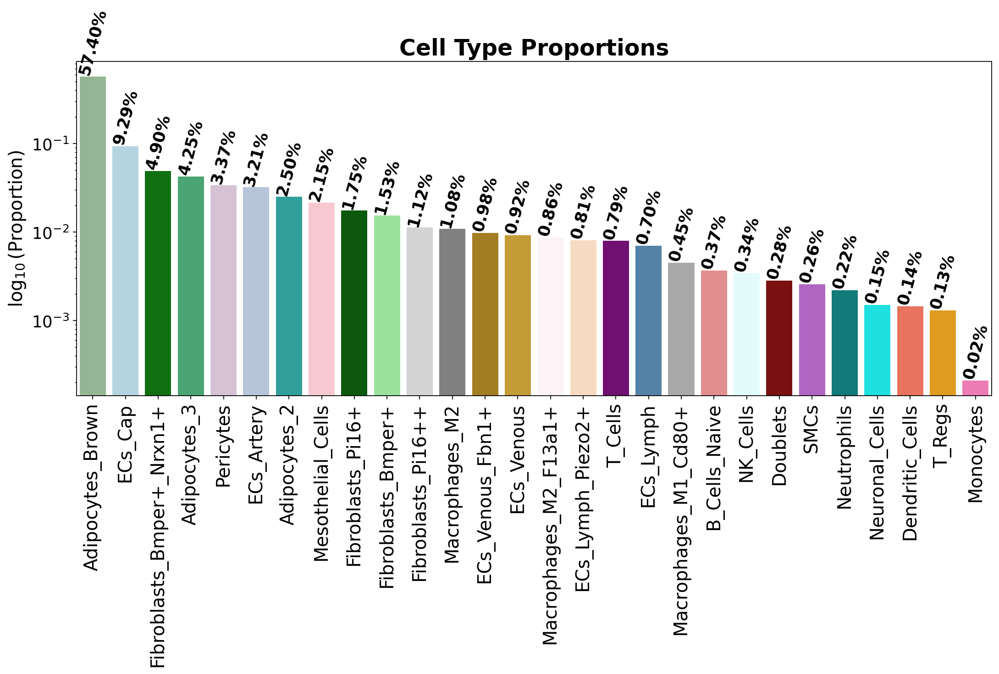

In [26]:
### Low-level cell type proportions plot using the same colors as the UMAP.

list = ['Adipocytes_Brown', 'ECs_Cap', 'Fibroblasts_Bmper+_Nrxn1+', 'Adipocytes_3', 'Pericytes', 'ECs_Artery', 'Adipocytes_2',
        'Mesothelial_Cells', 'Fibroblasts_Pi16+', 'Fibroblasts_Bmper+', 'Fibroblasts_Pi16++', 'Macrophages_M2', 'ECs_Venous_Fbn1+', 
        'ECs_Venous', 'Macrophages_M2_F13a1+', 'ECs_Lymph_Piezo2+', 'T_Cells', 'ECs_Lymph', 'Macrophages_M1_Cd80+', 'B_Cells_Naive', 
        'NK_Cells', 'Doublets', 'SMCs', 'Neutrophils', 'Neuronal_Cells', 'Dendritic_Cells', 'T_Regs', 'Monocytes']


color = dict(zip(list, cf.large_palette))

# Adjust font sizes
plt.rcParams.update({'font.size': 16,   # Increase font size for tick labels, axis labels, and legend
                     'axes.titlesize': 22,  # Increase font size for title
                     'axes.labelsize': 20,  # Increase font size for axis labels
                     'xtick.labelsize': 20, # Increase font size for x-axis tick labels
                     'ytick.labelsize': 16})# Increase font size for y-axis tick labels
# Get the colors used in the UMAP plot
umap_colors = adata.uns['celltype_colors']

fig, ax = plt.subplots(figsize = (16,6))

N = len(adata)
j = 0
props_dict = {"Cell Type":[], "Proportion":[], "Color":[]}
for i in np.unique(adata.obs.celltype):
    i_len = len(adata[adata.obs.celltype == i])
    props_dict["Cell Type"].append(i)
    props_dict["Proportion"].append(i_len/N)
    props_dict["Color"].append(umap_colors[j])  # Map the exact color used in the UMAP plot
    j+=1
props_df = pd.DataFrame(props_dict)

sns.barplot(x = "Cell Type", y = "Proportion", ax = ax, data = props_df, log = True, palette = props_df.sort_values(by = 'Proportion', ascending = False).Color,
            order = props_df.sort_values("Proportion", ascending = False)["Cell Type"])
plt.xticks(rotation = 90, fontsize = 18)
plt.xlabel('')
plt.ylabel(r'$\log_{10}(\mathrm{Proportion})$', fontsize=18)
#plt.ylabel("log10(Proportion)")
plt.title('Cell Type Proportions', fontweight = 'bold')  # Add title
ax.grid(False)

# After plotting
bars = ax.patches

for bar, proportion in zip(bars, props_df.sort_values("Proportion", ascending=False)["Proportion"]):
    # Get bar position
    x = bar.get_x() + bar.get_width() / 2
    y = bar.get_height()
    
    # Label with the *original* proportion (not log)
    ax.text(x, y, f"{proportion:.2%}",  # format as percent with 2 decimals
            ha='center', va='bottom', fontsize=16, weight = 'bold', rotation=75)

#plt.savefig('../output/taPVAT_high_level_proportions_labeled.png', bbox_inches = "tight")
plt.show()

## High-level cell types

### Bar plot of mean cell proportions across treatments

In [71]:
df_len = len(adata.obs.sample_id.unique()) * len(adata.obs.celltype_broad.unique())
df = pd.DataFrame(index=range(df_len),
                  columns = ['sample_id', 'tissue', 'diet', 'time', 'sex', 'celltype', 'celltype_number', 'total_number'])

i = 0
for sample_id in adata.obs.sample_id.unique():
    df_sample = adata.obs[adata.obs.sample_id == sample_id]
    for celltype in adata.obs.celltype_broad.unique():
            df.sample_id.iloc[i] = sample_id
            df.celltype.iloc[i] = celltype
            df.tissue.iloc[i] = df_sample.tissue.iloc[0]
            df.diet.iloc[i] = df_sample.diet.iloc[0]
            df.time.iloc[i] = df_sample.time.iloc[0]
            df.sex.iloc[i] = df_sample.sex.iloc[0]
            df.total_number.iloc[i] = len(df_sample)
            df.celltype_number.iloc[i] = len(df_sample[df_sample.celltype_broad == celltype])
            i+=1
df.head()

,sample_id,tissue,diet,time,sex,celltype,celltype_number,total_number
0,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Fibroblasts,383,1936
1,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Adipocytes,913,1936
2,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Immune_Cells,207,1936
3,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Endothelial_Cells,238,1936
4,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Pericytes,119,1936


In [72]:
### Calculate proportion for each row
df['proportion'] = df.celltype_number / df.total_number

# convert columns to numeric
df[["celltype_number", "total_number", "proportion"]] = df[["celltype_number", "total_number", "proportion"]].apply(pd.to_numeric)

df['sample_type'] = df.tissue + '_'+ df.diet + '_' + df.time + '_' + df.sex

df.head()

,sample_id,tissue,diet,time,sex,celltype,celltype_number,total_number,proportion,sample_type
0,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Fibroblasts,383,1936,0.197831,taPVAT_Control_8W_M
1,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Adipocytes,913,1936,0.471591,taPVAT_Control_8W_M
2,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Immune_Cells,207,1936,0.106921,taPVAT_Control_8W_M
3,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Endothelial_Cells,238,1936,0.122934,taPVAT_Control_8W_M
4,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Pericytes,119,1936,0.061467,taPVAT_Control_8W_M


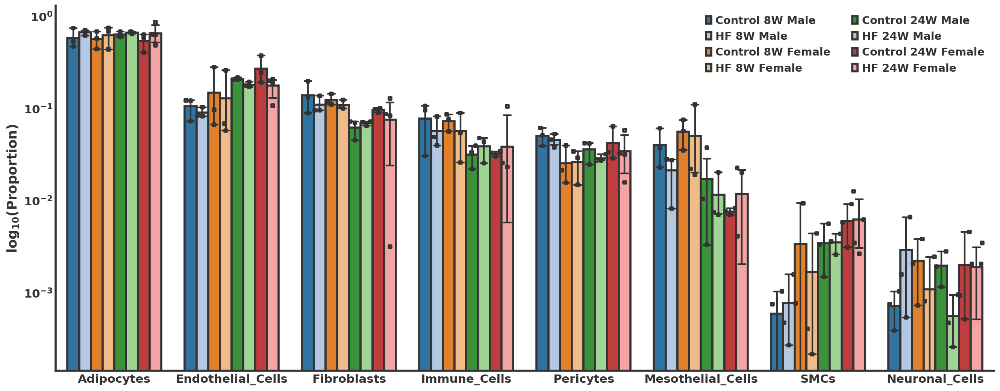

In [73]:
plt.figure(figsize = (20,8))
plt.style.use("seaborn-white")

group_order = ['taPVAT_Control_8W_M','taPVAT_HF_8W_M', 'taPVAT_Control_8W_F', 'taPVAT_HF_8W_F', 
               'taPVAT_Control_24W_M', 'taPVAT_HF_24W_M', 'taPVAT_Control_24W_F', 'taPVAT_HF_24W_F']

cell_type_order = ['Adipocytes',  'Endothelial_Cells', 'Fibroblasts', 'Immune_Cells',
                   'Pericytes', 'Mesothelial_Cells',  'SMCs', 'Neuronal_Cells']

legend_labels = ['Control 8W Male', 'HF 8W Male', 'Control 8W Female', 'HF 8W Female', 
              'Control 24W Male', 'HF 24W Male', 'Control 24W Female', 'HF 24W Female',
                 'Control 8W Male', 'HF 8W Male', 'Control 8W Female', 'HF 8W Female', 
              'Control 24W Male', 'HF 24W Male', 'Control 24W Female', 'HF 24W Female']

ax = sns.barplot(data = df, x = 'celltype', y = 'proportion', capsize = 0.06, edgecolor = '0.2', lw = 2.5, errwidth = 2, 
                palette = 'tab20', errcolor = '0.2', hue = 'sample_type', order = cell_type_order, hue_order = group_order)

kwargs = {'edgecolor':'0.2', 'linewidth':2.5, 'fc': 'none'}

ax = sns.swarmplot(data = df, x = 'celltype', y = 'proportion', hue = 'sample_type',
                   dodge = 0.4, marker = 's', s = 3, order = cell_type_order, hue_order = group_order, **kwargs)

prev_lim = ax.get_ylim()[1]

#max_val = max(vals)


handles, labels = ax.get_legend_handles_labels()

plt.legend(handles[8:], legend_labels[8:], loc = 'upper right', # bbox_to_anchor = (1, 0), 
          ncol = 2, frameon = False, fontsize = 18, labelcolor = '0.2', prop = {'weight': 'bold'})



for axis in ['bottom', 'left']:
    ax.spines[axis].set_linewidth(2.5)
    ax.spines[axis].set_color('0.2')
    
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_yscale('log')

plt.xticks(size = 14, ha = 'center', weight = 'bold', color = '0.2')
plt.yticks(size = 14, weight = 'bold', color = '0.2')

ax.tick_params(width = 2.5, color = '0.2')

plt.xlabel('')
plt.ylabel(r'$\mathbf{log_{10}(\mathrm{\mathbf{Proportion}})}$', size = 16, color = '0.2')

#plt.ylim(top = prev_lim)


plt.savefig('../output/barplot.svg', bbox_inches = 'tight')
plt.savefig('../output/barplot.png', bbox_inches = 'tight', dpi = 600, facecolor = ax.get_facecolor())
plt.show()

In [11]:
df.to_csv('../data/celltype_proportions.csv', index = False)

### Heatmap of mean cell proportions across treatments

In [73]:
df = pd.read_csv('../data/celltype_proportions.csv')

In [74]:
df

,sample_id,tissue,diet,time,sex,celltype,celltype_number,total_number,proportion,sample_type
0,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Fibroblasts,383,1936,0.197831,taPVAT_Control_8W_M
1,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Adipocytes,913,1936,0.471591,taPVAT_Control_8W_M
2,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Immune_Cells,207,1936,0.106921,taPVAT_Control_8W_M
3,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Endothelial_Cells,238,1936,0.122934,taPVAT_Control_8W_M
4,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Pericytes,119,1936,0.061467,taPVAT_Control_8W_M
...,...,...,...,...,...,...,...,...,...,...
195,P_HF_8W_F_03,taPVAT,HF,8W,F,Endothelial_Cells,268,4646,0.057684,taPVAT_HF_8W_F
196,P_HF_8W_F_03,taPVAT,HF,8W,F,Pericytes,69,4646,0.014851,taPVAT_HF_8W_F
197,P_HF_8W_F_03,taPVAT,HF,8W,F,Mesothelial_Cells,103,4646,0.022170,taPVAT_HF_8W_F
198,P_HF_8W_F_03,taPVAT,HF,8W,F,Neuronal_Cells,0,4646,0.000000,taPVAT_HF_8W_F


In [74]:
df_pivot = df.pivot_table(index = 'celltype', columns = 'sample_type', values = 'proportion', aggfunc = 'mean')
df_pivot = df_pivot[['taPVAT_Control_8W_M', 'taPVAT_HF_8W_M', 'taPVAT_Control_8W_F', 'taPVAT_HF_8W_F', 
                    'taPVAT_Control_24W_M','taPVAT_HF_24W_M', 'taPVAT_Control_24W_F', 'taPVAT_HF_24W_F']]

### Divide each cell by the first column number
df_pivot = df_pivot.div(df_pivot['taPVAT_Control_8W_M'], axis = 0)
### Multiply each cell by 100 to get a proportion percentage
df_pivot = df_pivot.apply(lambda x: np.log2(x))
#df_pivot = df_pivot.apply(lambda x: x * 100)

df_pivot

sample_type,taPVAT_Control_8W_M,taPVAT_HF_8W_M,taPVAT_Control_8W_F,taPVAT_HF_8W_F,taPVAT_Control_24W_M,taPVAT_HF_24W_M,taPVAT_Control_24W_F,taPVAT_HF_24W_F
celltype,,,,,,,,
Adipocytes,0.0,0.202831,-0.043459,0.097521,0.126963,0.187648,-0.108712,0.163566
Endothelial_Cells,0.0,-0.233122,0.486452,0.281525,0.980392,0.774982,1.355526,0.739260
Fibroblasts,0.0,-0.349192,-0.167489,-0.349453,-1.162150,-1.007262,-0.534032,-0.886827
Immune_Cells,0.0,-0.447104,-0.088161,-0.450985,-1.300516,-0.995163,-1.253611,-1.010095
Mesothelial_Cells,0.0,-0.925640,0.469309,0.325197,-1.234952,-1.797828,-2.401390,-1.778699
Neuronal_Cells,0.0,2.009952,1.613488,0.586614,1.439306,-0.371406,1.471628,1.391089
Pericytes,0.0,-0.150819,-0.983118,-0.953513,-0.482980,-0.808835,-0.261608,-0.552798
SMCs,0.0,0.382673,2.507810,1.496027,2.543765,2.567420,3.340853,3.389258


In [114]:
df_pivot.index

Index(['Adipocytes', 'Endothelial_Cells', 'Fibroblasts', 'Immune_Cells',
       'Mesothelial_Cells', 'Neuronal_Cells', 'Pericytes', 'SMCs'],
      dtype='object', name='celltype')

In [16]:
df_pivot.to_csv('./celltype_proportions_pivot.csv')

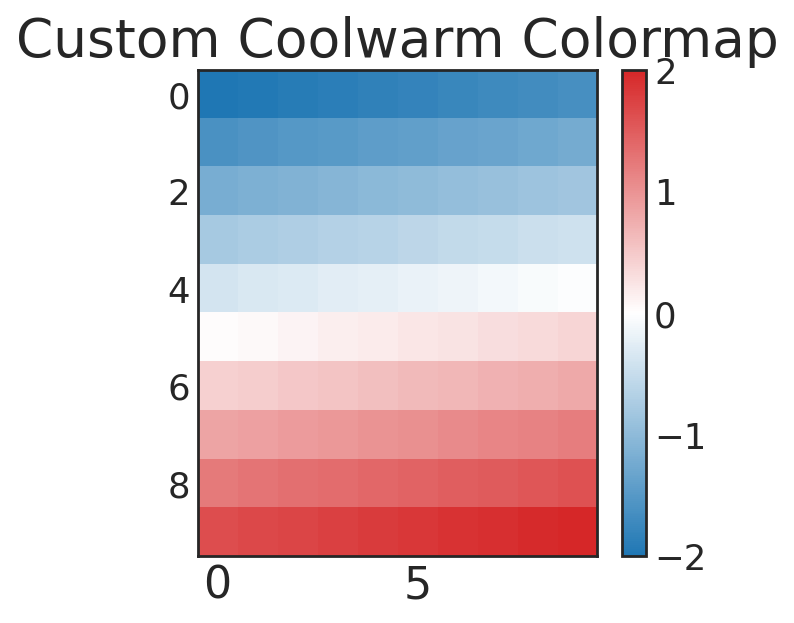

In [75]:
### Choose a good colormap.
cmap = plt.cm.coolwarm

# Define colors for custom colormap: blue -> white -> red
colors = [
    (0.0, '#1F77B4'),  # Start at blue
    (0.5, "white"), # Center at white
    (1.0, '#D62728'),   # End at red
]

# Create the colormap
custom_cmap = LinearSegmentedColormap.from_list("custom_coolwarm", colors)

# Test the colormap
x = np.linspace(-2, 2, 100).reshape(10, 10)
plt.imshow(x, cmap=custom_cmap, aspect='auto')
plt.colorbar()
plt.title("Custom Coolwarm Colormap")
plt.show()


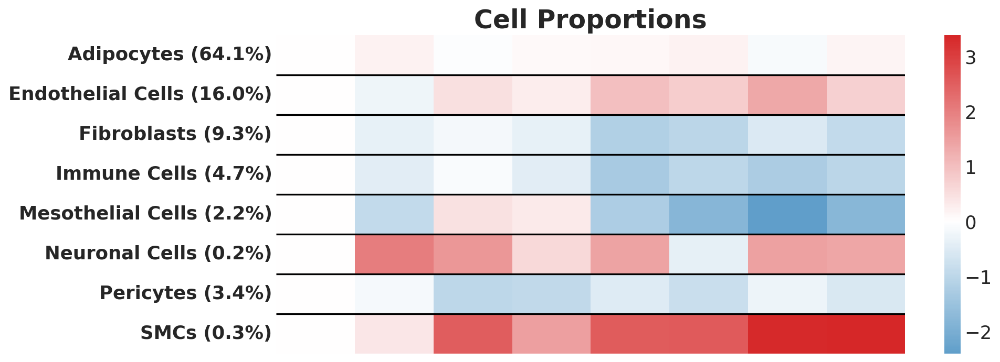

In [79]:
### Create the heatmap
plt.figure(figsize=(12, 5))  # Optional: adjust figure size
ax = sns.heatmap(df_pivot, annot=False, fmt = '.0f', cmap=custom_cmap, cbar=True, xticklabels=False, center = 0)

ax.set(xlabel='', ylabel='')
ax.set_yticklabels(['Adipocytes (64.1%)', 'Endothelial Cells (16.0%)', 'Fibroblasts (9.3%)', 'Immune Cells (4.7%)',
                    'Mesothelial Cells (2.2%)', 'Neuronal Cells (0.2%)', 'Pericytes (3.4%)', 'SMCs (0.3%)'], 
                     fontweight='bold', fontsize = 16)
ax.hlines([1, 2, 3, 4, 5, 6, 7], *ax.get_xlim(), color = 'black')

# Display the heatmap

plt.title('Cell Proportions', fontweight = 'bold', fontsize = 22)
plt.savefig('./test_heatmap.png', bbox_inches = 'tight', dpi = 600)
plt.show()

### Simple t-test to compare high-level cell type proportions

In [32]:
def prop_stat(sample_type_1, sample_type_2):
    stat, pvalue = stats.ttest_ind(df[df.celltype == celltype][df.sample_type == sample_type_1].proportion,
                   df[df.celltype == celltype][df.sample_type == sample_type_2].proportion, equal_var = False
    )
    celltype_ls.append(celltype)
    sample_type_1_ls.append(sample_type_1)
    sample_type_2_ls.append(sample_type_2)
    mean_1_ls.append(np.mean(df[df.celltype == celltype][df.sample_type == sample_type_1].proportion))
    mean_2_ls.append(np.mean(df[df.celltype == celltype][df.sample_type == sample_type_2].proportion))
    pvalue_ls.append(pvalue)

In [33]:
celltype_ls = []
sample_type_1_ls = []
sample_type_2_ls = []
mean_1_ls = []
mean_2_ls = []
pvalue_ls = []

for celltype in df.celltype.unique():
    prop_stat('taPVAT_Control_8W_M', 'taPVAT_HF_8W_M')
    prop_stat('taPVAT_Control_8W_F', 'taPVAT_HF_8W_F')
    prop_stat('taPVAT_Control_24W_M', 'taPVAT_HF_24W_M')
    prop_stat('taPVAT_Control_24W_F', 'taPVAT_HF_24W_F')
    prop_stat('taPVAT_Control_8W_M', 'taPVAT_Control_24W_M')
    prop_stat('taPVAT_Control_8W_F', 'taPVAT_Control_24W_F')
    prop_stat('taPVAT_HF_8W_M', 'taPVAT_HF_24W_M')
    prop_stat('taPVAT_HF_8W_F', 'taPVAT_HF_24W_F')
    prop_stat('taPVAT_Control_8W_M', 'taPVAT_Control_8W_F')
    prop_stat('taPVAT_HF_8W_M', 'taPVAT_HF_8W_F')
    prop_stat('taPVAT_Control_24W_M', 'taPVAT_Control_24W_F')
    prop_stat('taPVAT_HF_24W_M', 'taPVAT_HF_24W_F')
    

In [35]:
dict = {'celltype': celltype_ls, 'sample_type_1': sample_type_1_ls, 'sample_type_2': sample_type_2_ls, 'mean_1': mean_1_ls, 'mean_2': mean_2_ls, 'pvalue': pvalue_ls} 
df_stats = pd.DataFrame(dict)

In [37]:
### List all comparisons with pvalue at or below 0.05
df_stats[df_stats.pvalue <= 0.05]

,celltype,sample_type_1,sample_type_2,mean_1,mean_2,pvalue
10,Fibroblasts,taPVAT_Control_24W_M,taPVAT_Control_24W_F,0.062359,0.096379,0.043773
29,Immune_Cells,taPVAT_Control_8W_F,taPVAT_Control_24W_F,0.073083,0.032582,0.042843
38,Endothelial_Cells,taPVAT_Control_24W_M,taPVAT_HF_24W_M,0.208935,0.181208,0.035794
40,Endothelial_Cells,taPVAT_Control_8W_M,taPVAT_Control_24W_M,0.105897,0.208935,0.019034
42,Endothelial_Cells,taPVAT_HF_8W_M,taPVAT_HF_24W_M,0.090096,0.181208,0.000702
90,SMCs,taPVAT_HF_8W_M,taPVAT_HF_24W_M,0.000776,0.003527,0.015299


In [38]:
df_stats.to_csv('./cell_props_with_stats.csv', index = False)

## Low-level cell types

### Bar plot of mean cell proportions across treatments

In [80]:
df_len = len(adata.obs.sample_id.unique()) * len(adata.obs.celltype.unique())
df = pd.DataFrame(index=range(df_len),
                  columns = ['sample_id', 'tissue', 'diet', 'time', 'sex', 'celltype', 'celltype_number', 'total_number'])

i = 0
for sample_id in adata.obs.sample_id.unique():
    df_sample = adata.obs[adata.obs.sample_id == sample_id]
    for celltype in adata.obs.celltype.unique():
            df.sample_id.iloc[i] = sample_id
            df.celltype.iloc[i] = celltype
            df.tissue.iloc[i] = df_sample.tissue.iloc[0]
            df.diet.iloc[i] = df_sample.diet.iloc[0]
            df.time.iloc[i] = df_sample.time.iloc[0]
            df.sex.iloc[i] = df_sample.sex.iloc[0]
            df.total_number.iloc[i] = len(df_sample)
            df.celltype_number.iloc[i] = len(df_sample[df_sample.celltype == celltype])
            i+=1
df.head()

,sample_id,tissue,diet,time,sex,celltype,celltype_number,total_number
0,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Fibroblasts_Bmper+_Nrxn1+,251,1936
1,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Adipocytes_2,51,1936
2,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Macrophages_M2,41,1936
3,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Adipocytes_Brown,780,1936
4,P_CTRL_8W_M_01,taPVAT,Control,8W,M,ECs_Venous_Fbn1+,30,1936


In [81]:
### Calculate proportion for each row
df['proportion'] = df.celltype_number / df.total_number

# convert columns to numeric
df[["celltype_number", "total_number", "proportion"]] = df[["celltype_number", "total_number", "proportion"]].apply(pd.to_numeric)

df['sample_type'] = df.tissue + '_'+ df.diet + '_' + df.time + '_' + df.sex

df.head()

,sample_id,tissue,diet,time,sex,celltype,celltype_number,total_number,proportion,sample_type
0,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Fibroblasts_Bmper+_Nrxn1+,251,1936,0.129649,taPVAT_Control_8W_M
1,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Adipocytes_2,51,1936,0.026343,taPVAT_Control_8W_M
2,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Macrophages_M2,41,1936,0.021178,taPVAT_Control_8W_M
3,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Adipocytes_Brown,780,1936,0.402893,taPVAT_Control_8W_M
4,P_CTRL_8W_M_01,taPVAT,Control,8W,M,ECs_Venous_Fbn1+,30,1936,0.015496,taPVAT_Control_8W_M


In [82]:
df.sort_values(['celltype_number'], ascending = False).celltype.unique()

array(['Adipocytes_Brown', 'ECs_Cap', 'Adipocytes_3', 'Adipocytes_2',
       'Fibroblasts_Bmper+_Nrxn1+', 'ECs_Artery', 'Mesothelial_Cells',
       'Pericytes', 'Fibroblasts_Pi16+', 'Fibroblasts_Bmper+',
       'Macrophages_M2', 'T_Cells', 'Fibroblasts_Pi16++', 'ECs_Venous',
       'ECs_Venous_Fbn1+', 'ECs_Lymph', 'Macrophages_M1_Cd80+',
       'ECs_Lymph_Piezo2+', 'Macrophages_M2_F13a1+', 'NK_Cells',
       'B_Cells_Naive', 'SMCs', 'Neutrophils', 'Doublets', 'T_Regs',
       'Neuronal_Cells', 'Dendritic_Cells', 'Monocytes'], dtype=object)

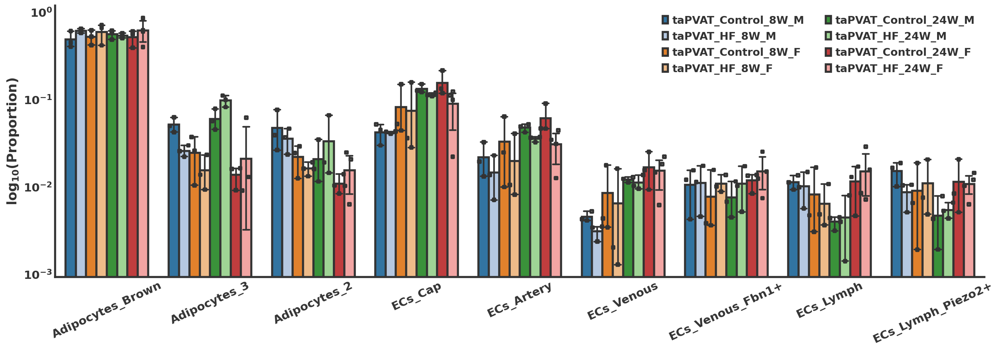

In [83]:
plt.figure(figsize = (20,6))
plt.style.use("seaborn-white")

group_order = ['taPVAT_Control_8W_M','taPVAT_HF_8W_M', 'taPVAT_Control_8W_F', 'taPVAT_HF_8W_F', 
               'taPVAT_Control_24W_M', 'taPVAT_HF_24W_M', 'taPVAT_Control_24W_F', 'taPVAT_HF_24W_F']

cell_type_order = ['Adipocytes_Brown', 'Adipocytes_3', 'Adipocytes_2', 'ECs_Cap', 
                    'ECs_Artery', 'ECs_Venous', 'ECs_Venous_Fbn1+', 'ECs_Lymph', 'ECs_Lymph_Piezo2+',
                   
                   # 'Fibroblasts_Bmper+_Nrxn1+', 'Fibroblasts_Pi16+', 'Fibroblasts_Bmper+',
                   # 'Fibroblasts_Pi16++', 'Pericytes', 'Mesothelial_Cells', 'SMCs', 'Doublets', 'Neuronal_Cells',
                   
                   #  
                   # 'Macrophages_M2', 'T_Cells',  
                   # 'Macrophages_M1_Cd80+',
                   #  'Macrophages_M2_F13a1+', 'NK_Cells',
                   # 'B_Cells_Naive',  'Neutrophils',  'T_Regs',
                   #  'Dendritic_Cells', 'Monocytes'
                  ]

ax = sns.barplot(data = df, x = 'celltype', y = 'proportion', capsize = 0.06, edgecolor = '0.2', lw = 2.5, errwidth = 2, 
                palette = 'tab20', errcolor = '0.2', hue = 'sample_type', order = cell_type_order, hue_order = group_order)

kwargs = {'edgecolor':'0.2', 'linewidth':2.5, 'fc': 'none'}

ax = sns.swarmplot(data = df, x = 'celltype', y = 'proportion', hue = 'sample_type',
                   dodge = 0.4, marker = 's', s = 3, order = cell_type_order, hue_order = group_order, **kwargs)

prev_lim = ax.get_ylim()[1]

#max_val = max(vals)


handles, labels = ax.get_legend_handles_labels()

plt.legend(handles[8:], labels[8:], loc = 'upper right', # bbox_to_anchor = (1, 0), 
          ncol = 2, frameon = False, fontsize = 14, labelcolor = '0.2', prop = {'weight': 'bold'})



for axis in ['bottom', 'left']:
    ax.spines[axis].set_linewidth(2.5)
    ax.spines[axis].set_color('0.2')
    
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_yscale('log')

plt.xticks(size = 14, ha = 'center', weight = 'bold', color = '0.2', rotation = 25)
plt.yticks(size = 14, weight = 'bold', color = '0.2')

ax.tick_params(width = 2.5, color = '0.2')

plt.xlabel('')
plt.ylabel(r'$\mathbf{log_{10}(\mathrm{\mathbf{Proportion}})}$', size = 16, color = '0.2')

#plt.ylim(top = prev_lim)


plt.savefig('barplot_specific.svg', bbox_inches = 'tight')
# plt.savefig('barplot_specific.png', bbox_inches = 'tight', dpi = 600, facecolor = ax.get_facecolor())
#plt.show()

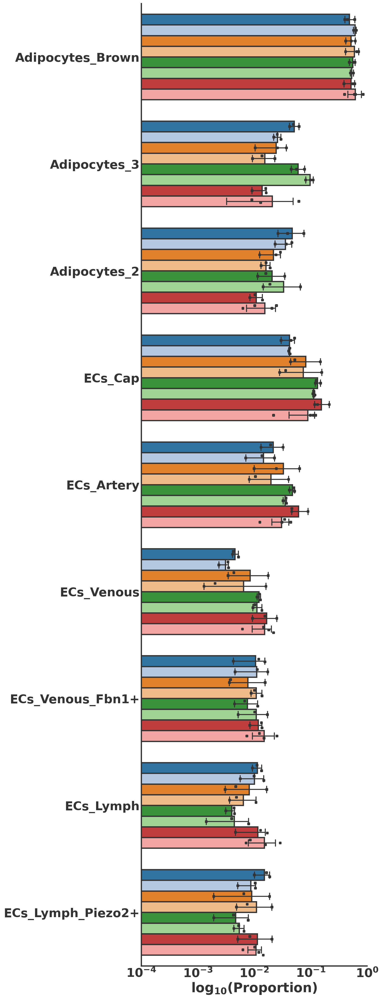

In [17]:
plt.figure(figsize = (8, 35))  # Adjust the figure size for a vertical plot
plt.style.use("seaborn-white")

group_order = ['taPVAT_Control_8W_M','taPVAT_HF_8W_M', 'taPVAT_Control_8W_F', 'taPVAT_HF_8W_F', 
               'taPVAT_Control_24W_M', 'taPVAT_HF_24W_M', 'taPVAT_Control_24W_F', 'taPVAT_HF_24W_F']

# cell_type_order = ['Adipocytes_Brown', 'ECs_Cap', 'Adipocytes_3', 'Adipocytes_2',
#                    'Fibroblasts_Bmper+_Nrxn1+', 'ECs_Artery', 'Mesothelial_Cells',
#                    'Pericytes', 'Fibroblasts_Pi16+', #'Fibroblasts_Bmper+',
#                    #'Macrophages_M2', 'T_Cells', 'Fibroblasts_Pi16++', 'ECs_Venous',
#                    #'ECs_Venous_Fbn1+', 'ECs_Lymph', 'Macrophages_M1_Cd80+',
#                    #'ECs_Lymph_Piezo2+', 'Macrophages_M2_F13a1+', 'NK_Cells',
#                    #'B_Cells_Naive', 'SMCs', 'Neutrophils', 'Doublets', 'T_Regs',
#                    #'Neuronal_Cells', 'Dendritic_Cells', 'Monocytes'
#                   ]

cell_type_order = ['Adipocytes_Brown', 'Adipocytes_3', 'Adipocytes_2', 'ECs_Cap', 
                    'ECs_Artery', 'ECs_Venous', 'ECs_Venous_Fbn1+', 'ECs_Lymph', 'ECs_Lymph_Piezo2+',
                   
                   # 'Fibroblasts_Bmper+_Nrxn1+', 'Fibroblasts_Pi16+', 'Fibroblasts_Bmper+',
                   # 'Fibroblasts_Pi16++', 'Pericytes', 'Mesothelial_Cells', 'SMCs', 'Doublets', 'Neuronal_Cells',
                   
                   #  
                   # 'Macrophages_M2', 'T_Cells',  
                   # 'Macrophages_M1_Cd80+',
                   #  'Macrophages_M2_F13a1+', 'NK_Cells',
                   # 'B_Cells_Naive',  'Neutrophils',  'T_Regs',
                   #  'Dendritic_Cells', 'Monocytes'
                  ]

# Swap x and y in the barplot
ax = sns.barplot(data = df, y = 'celltype', x = 'proportion', capsize = 0.06, edgecolor = '0.2', lw = 2.5, errwidth = 2, 
                palette = 'tab20', errcolor = '0.2', hue = 'sample_type', order = cell_type_order, hue_order = group_order)

kwargs = {'edgecolor':'0.2', 'linewidth':2.5, 'fc': 'none'}

# Swap x and y in the swarmplot
ax = sns.swarmplot(data = df, y = 'celltype', x = 'proportion', hue = 'sample_type',
                   dodge = 0.4, marker = 's', s = 3, order = cell_type_order, hue_order = group_order, **kwargs)

prev_lim = ax.get_xlim()[1]  # Get x-limit instead of y-limit now

# handles, labels = ax.get_legend_handles_labels()

# plt.legend(handles[8:], labels[8:], loc = 'lower right', # bbox_to_anchor = (1, 0), 
#           ncol = 1, frameon = False, fontsize = 18, labelcolor = '0.2', prop = {'weight': 'bold'})

for axis in ['bottom', 'left']:
    ax.spines[axis].set_linewidth(2.5)
    ax.spines[axis].set_color('0.2')
    
leg = plt.legend()
 
ax.get_legend().set_visible(False)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_xscale('log')  # Use log scale for x-axis now

plt.xlim(10**(-4), 10**(0))

# Adjust the margins to fit the long y-tick labels

plt.xticks(size = 24, weight = 'bold', color = '0.2')
plt.yticks(size = 24, weight = 'bold', color = '0.2')  # Ensure no rotation for y-axis labels

ax.tick_params(width = 2.5, color = '0.2')

plt.ylabel('')
plt.xlabel(r'$\mathbf{log_{10}(\mathrm{\mathbf{Proportion}})}$', size = 26, color = '0.2')

plt.savefig('vertical_barplot_specific.svg', bbox_inches = 'tight', transparent=True)
# plt.savefig('vertical_barplot_specific.png', bbox_inches = 'tight', dpi = 600, facecolor = ax.get_facecolor())
#plt.show()


### Heatmap of mean cell proportions across treatments

In [19]:
df

,sample_id,tissue,diet,time,sex,celltype,celltype_number,total_number,proportion,sample_type
0,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Fibroblasts_Bmper+_Nrxn1+,251,1936,0.129649,taPVAT_Control_8W_M
1,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Adipocytes_2,51,1936,0.026343,taPVAT_Control_8W_M
2,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Macrophages_M2,41,1936,0.021178,taPVAT_Control_8W_M
3,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Adipocytes_Brown,780,1936,0.402893,taPVAT_Control_8W_M
4,P_CTRL_8W_M_01,taPVAT,Control,8W,M,ECs_Venous_Fbn1+,30,1936,0.015496,taPVAT_Control_8W_M
...,...,...,...,...,...,...,...,...,...,...
695,P_HF_8W_F_03,taPVAT,HF,8W,F,B_Cells_Naive,19,4646,0.004090,taPVAT_HF_8W_F
696,P_HF_8W_F_03,taPVAT,HF,8W,F,NK_Cells,18,4646,0.003874,taPVAT_HF_8W_F
697,P_HF_8W_F_03,taPVAT,HF,8W,F,T_Regs,10,4646,0.002152,taPVAT_HF_8W_F
698,P_HF_8W_F_03,taPVAT,HF,8W,F,Monocytes,1,4646,0.000215,taPVAT_HF_8W_F


In [53]:
df.celltype.unique()

array(['Fibroblasts_Bmper+_Nrxn1+', 'Adipocytes_2', 'Macrophages_M2',
       'Adipocytes_Brown', 'ECs_Venous_Fbn1+', 'ECs_Lymph',
       'Fibroblasts_Pi16+', 'ECs_Artery', 'Adipocytes_3', 'Pericytes',
       'Macrophages_M2_F13a1+', 'Mesothelial_Cells', 'ECs_Cap',
       'Fibroblasts_Bmper+', 'ECs_Lymph_Piezo2+', 'Neuronal_Cells',
       'Neutrophils', 'T_Cells', 'Doublets', 'Fibroblasts_Pi16++',
       'ECs_Venous', 'Macrophages_M1_Cd80+', 'Dendritic_Cells',
       'B_Cells_Naive', 'NK_Cells', 'T_Regs', 'Monocytes', 'SMCs'],
      dtype=object)

In [58]:
df_pivot

sample_type,taPVAT_Control_8W_M,taPVAT_HF_8W_M,taPVAT_Control_8W_F,taPVAT_HF_8W_F,taPVAT_Control_24W_M,taPVAT_HF_24W_M,taPVAT_Control_24W_F,taPVAT_HF_24W_F
celltype,,,,,,,,
Adipocytes_2,0.0,-0.405279,-1.099225,-1.541201,-1.180251,-0.510140,-2.112307,-1.605147
Adipocytes_3,0.0,-0.992593,-1.071921,-1.736497,0.221470,0.918621,-1.895585,-1.292613
Adipocytes_Brown,0.0,0.331210,0.099772,0.289230,0.198263,0.139717,0.090529,0.347408
B_Cells_Naive,0.0,-0.219926,-1.090866,-0.463186,-2.020617,-0.652726,-3.249136,-3.335544
Dendritic_Cells,0.0,0.782759,1.349702,1.027863,0.665695,1.008880,0.998804,1.952889
Doublets,0.0,1.263841,1.115391,0.951649,0.039161,0.669454,1.666057,1.192714
ECs_Artery,0.0,-0.577336,0.590852,-0.135566,1.130235,0.703679,1.486791,0.492561
ECs_Cap,0.0,-0.001377,0.955084,0.807334,1.648133,1.427501,1.875119,1.075041
ECs_Lymph,0.0,-0.165523,-0.477321,-0.819416,-1.501291,-1.349091,0.026178,0.410296


In [84]:
df_pivot = df.pivot_table(index = 'celltype', columns = 'sample_type', values = 'proportion', aggfunc = 'mean')
df_pivot = df_pivot[df_pivot.index != 'Doublets'].copy()
df_pivot = df_pivot[['taPVAT_Control_8W_M', 'taPVAT_HF_8W_M', 'taPVAT_Control_8W_F', 'taPVAT_HF_8W_F', 
                    'taPVAT_Control_24W_M','taPVAT_HF_24W_M', 'taPVAT_Control_24W_F', 'taPVAT_HF_24W_F']]

reorder = ['Adipocytes_Brown', 'Adipocytes_2', 'Adipocytes_3', 
           'ECs_Artery', 'ECs_Cap', 'ECs_Lymph', 'ECs_Lymph_Piezo2+','ECs_Venous', 'ECs_Venous_Fbn1+', 
           'Fibroblasts_Bmper+', 'Fibroblasts_Bmper+_Nrxn1+','Fibroblasts_Pi16+', 'Fibroblasts_Pi16++',
           'B_Cells_Naive', 'Dendritic_Cells', 'Macrophages_M1_Cd80+', 'Macrophages_M2', 'Macrophages_M2_F13a1+', 'Monocytes', 
           'Neutrophils',   'NK_Cells', 'T_Cells', 'T_Regs',
           'Mesothelial_Cells', 'Neuronal_Cells','Pericytes', 'SMCs']

df_pivot = df_pivot.loc[reorder]

### Divide each cell by the first column number
df_pivot = df_pivot.div(df_pivot['taPVAT_Control_8W_M'], axis = 0)
### Multiply each cell by 100 to get a proportion percentage
df_pivot = df_pivot.apply(lambda x: np.log2(x))
#df_pivot = df_pivot.apply(lambda x: x * 100)

df_pivot

sample_type,taPVAT_Control_8W_M,taPVAT_HF_8W_M,taPVAT_Control_8W_F,taPVAT_HF_8W_F,taPVAT_Control_24W_M,taPVAT_HF_24W_M,taPVAT_Control_24W_F,taPVAT_HF_24W_F
celltype,,,,,,,,
Adipocytes_Brown,0.0,0.331210,0.099772,0.289230,0.198263,0.139717,0.090529,0.347408
Adipocytes_2,0.0,-0.405279,-1.099225,-1.541201,-1.180251,-0.510140,-2.112307,-1.605147
Adipocytes_3,0.0,-0.992593,-1.071921,-1.736497,0.221470,0.918621,-1.895585,-1.292613
ECs_Artery,0.0,-0.577336,0.590852,-0.135566,1.130235,0.703679,1.486791,0.492561
ECs_Cap,0.0,-0.001377,0.955084,0.807334,1.648133,1.427501,1.875119,1.075041
ECs_Lymph,0.0,-0.165523,-0.477321,-0.819416,-1.501291,-1.349091,0.026178,0.410296
ECs_Lymph_Piezo2+,0.0,-0.799103,-0.737570,-0.460801,-1.688064,-1.477855,-0.408272,-0.490488
ECs_Venous,0.0,-0.554255,0.902718,0.513355,1.419194,1.292653,1.872174,1.745322
ECs_Venous_Fbn1+,0.0,0.069852,-0.459876,0.040289,-0.477688,0.039945,0.162176,0.501547


In [85]:
df_pivot.to_csv("./cell_prop_specific.csv")

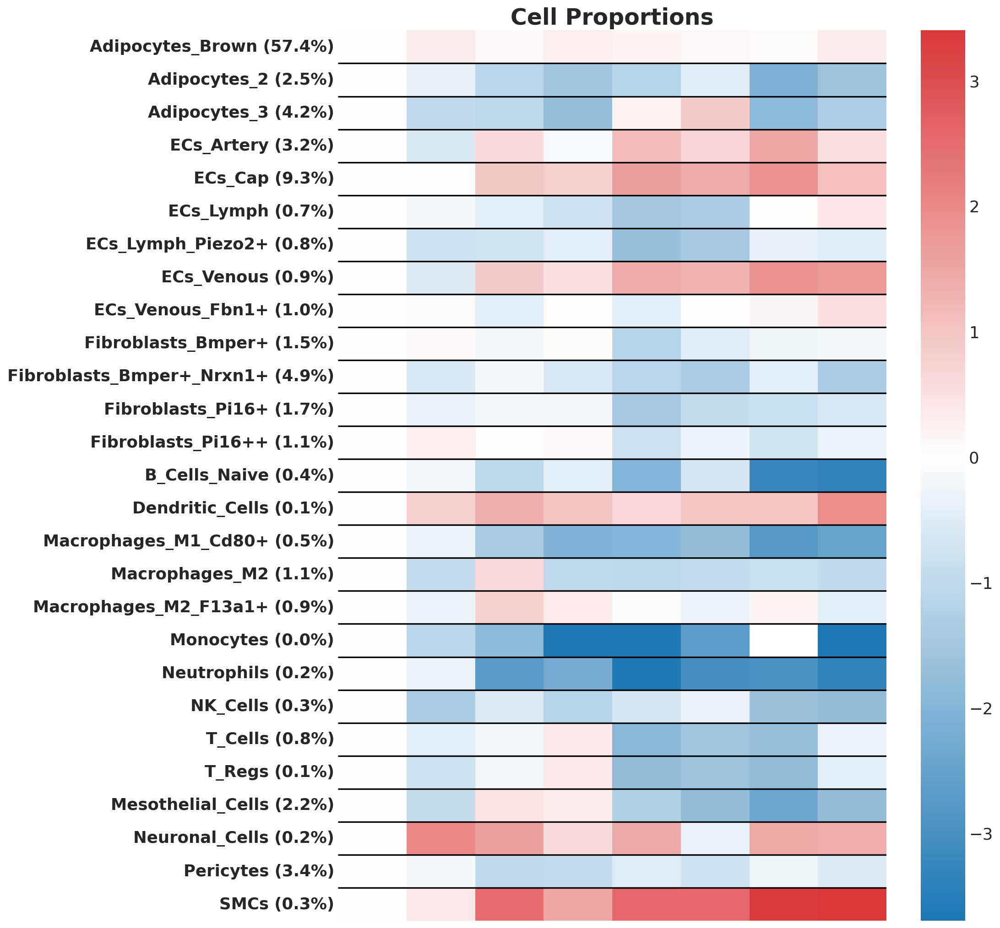

In [86]:
# Create the heatmap
plt.figure(figsize=(12, 16))  # Optional: adjust figure size

order = ['Adipocytes_Brown (57.4%)', 'Adipocytes_2 (2.5%)', 'Adipocytes_3 (4.2%)',
         'ECs_Artery (3.2%)', 'ECs_Cap (9.3%)', 'ECs_Lymph (0.7%)', 'ECs_Lymph_Piezo2+ (0.8%)', 'ECs_Venous (0.9%)', 'ECs_Venous_Fbn1+ (1.0%)',
         'Fibroblasts_Bmper+ (1.5%)', 'Fibroblasts_Bmper+_Nrxn1+ (4.9%)','Fibroblasts_Pi16+ (1.7%)', 'Fibroblasts_Pi16++ (1.1%)',
         'B_Cells_Naive (0.4%)','Dendritic_Cells (0.1%)', 'Macrophages_M1_Cd80+ (0.5%)', 'Macrophages_M2 (1.1%)', 'Macrophages_M2_F13a1+ (0.9%)', 
         'Monocytes (0.02%)', 'Neutrophils (0.2%)',  'NK_Cells (0.3%)', 'T_Cells (0.8%)', 'T_Regs (0.1%)',
         'Mesothelial_Cells (2.2%)','Neuronal_Cells (0.2%)','Pericytes (3.4%)', 'SMCs (0.3%)'
       ]

ax = sns.heatmap(df_pivot, annot=False, fmt = '.0f', cmap=custom_cmap, cbar=True, xticklabels=False, vmax = 3.4, vmin = -3.7, center = 0)

ax.set(xlabel='', ylabel='')
ax.set_yticklabels(order, fontweight='bold', fontsize = 16)
ax.hlines(np.arange(1,len(df_pivot)), *ax.get_xlim(), color = 'black')

# Display the heatmap

plt.title('Cell Proportions', fontweight = 'bold', fontsize = 22)
#plt.savefig('./test_heatmap_big.png', bbox_inches = 'tight', dpi = 600)
plt.show()

### Simple t-test to compare low-level cell type proportions

In [146]:
celltype_ls = []
sample_type_1_ls = []
sample_type_2_ls = []
pvalue_ls = []

for celltype in df.celltype.unique():
    prop_stat('taPVAT_Control_8W_M', 'taPVAT_HF_8W_M')
    prop_stat('taPVAT_Control_8W_F', 'taPVAT_HF_8W_F')
    prop_stat('taPVAT_Control_24W_M', 'taPVAT_HF_24W_M')
    prop_stat('taPVAT_Control_24W_F', 'taPVAT_HF_24W_F')
    prop_stat('taPVAT_Control_8W_M', 'taPVAT_Control_24W_M')
    prop_stat('taPVAT_Control_8W_F', 'taPVAT_Control_24W_F')
    prop_stat('taPVAT_HF_8W_M', 'taPVAT_HF_24W_M')
    prop_stat('taPVAT_HF_8W_F', 'taPVAT_HF_24W_F')
    prop_stat('taPVAT_Control_8W_M', 'taPVAT_Control_8W_F')
    prop_stat('taPVAT_HF_8W_M', 'taPVAT_HF_8W_F')
    prop_stat('taPVAT_Control_24W_M', 'taPVAT_Control_24W_F')
    prop_stat('taPVAT_HF_24W_M', 'taPVAT_HF_24W_F')
    

In [147]:
dict = {'celltype': celltype_ls, 'sample_type_1': sample_type_1_ls, 'sample_type_2': sample_type_2_ls, 'pvalue': pvalue_ls} 
df_stats = pd.DataFrame(dict)

In [148]:
df_stats[df_stats.pvalue <= 0.05]

,celltype,sample_type_1,sample_type_2,pvalue
6,Fibroblasts_Bmper+_Nrxn1+,taPVAT_HF_8W_M,taPVAT_HF_24W_M,0.019258
64,ECs_Lymph,taPVAT_Control_8W_M,taPVAT_Control_24W_M,0.017621
86,ECs_Artery,taPVAT_Control_24W_M,taPVAT_HF_24W_M,0.034834
88,ECs_Artery,taPVAT_Control_8W_M,taPVAT_Control_24W_M,0.027432
90,ECs_Artery,taPVAT_HF_8W_M,taPVAT_HF_24W_M,0.034941
96,Adipocytes_3,taPVAT_Control_8W_M,taPVAT_HF_8W_M,0.035973
98,Adipocytes_3,taPVAT_Control_24W_M,taPVAT_HF_24W_M,0.044469
102,Adipocytes_3,taPVAT_HF_8W_M,taPVAT_HF_24W_M,0.010046
106,Adipocytes_3,taPVAT_Control_24W_M,taPVAT_Control_24W_F,0.034350
107,Adipocytes_3,taPVAT_HF_24W_M,taPVAT_HF_24W_F,0.006440


In [150]:
df_stats.to_csv('./cell_prop_stats_specific.csv', index = False)

## Proportion differences between diet, time, and sex across high and low level cell types

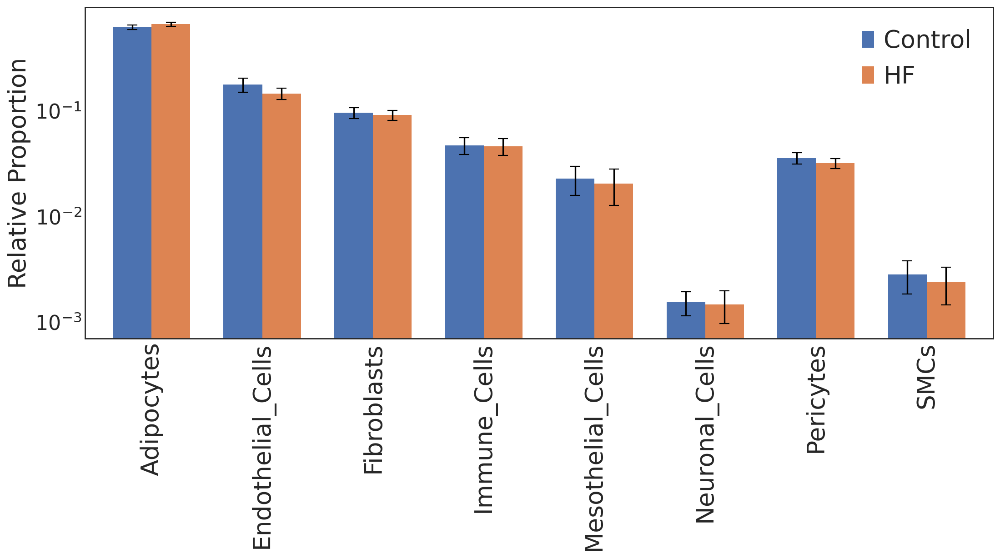

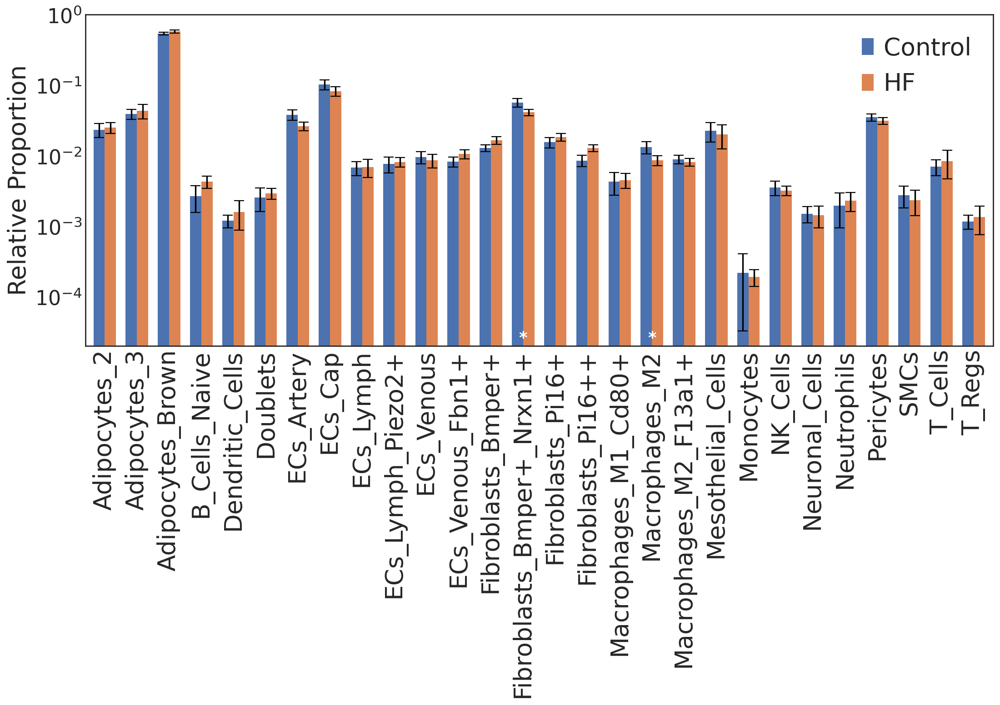

In [8]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata, 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata, 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

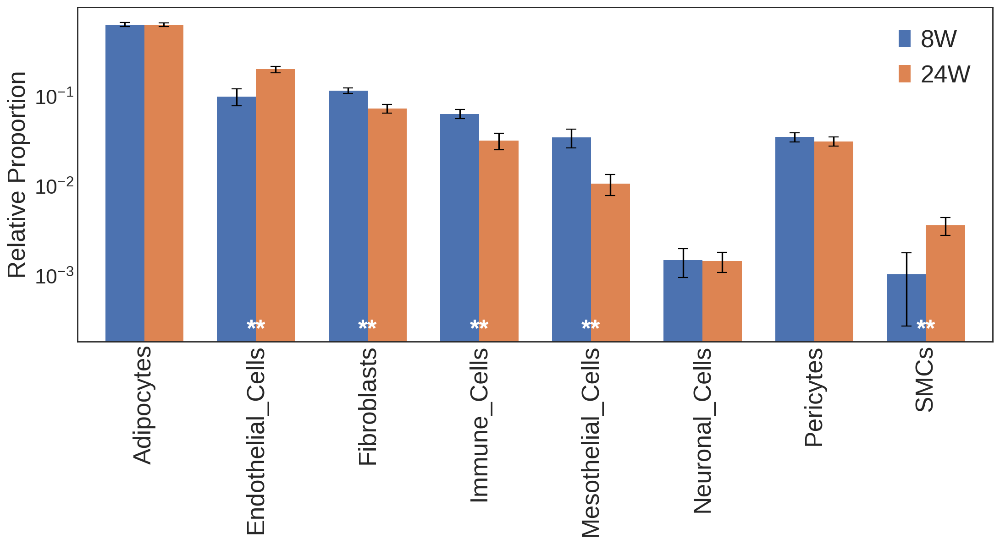

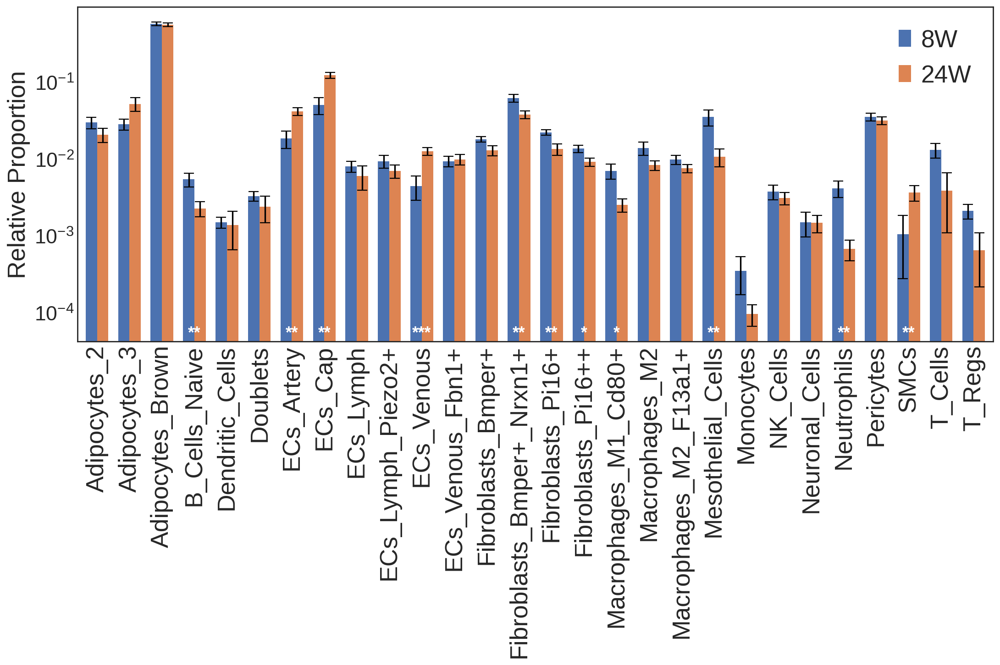

In [56]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata, 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata, 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

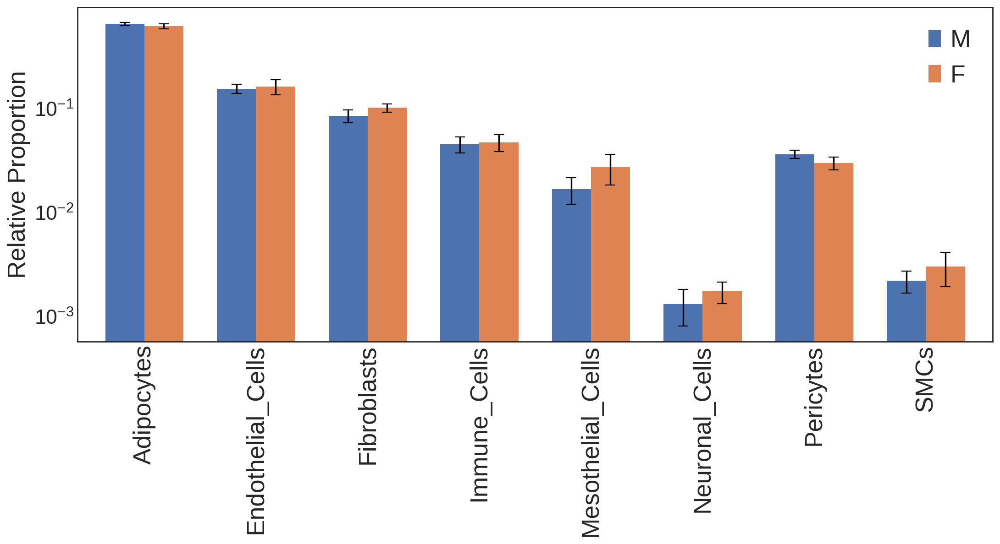

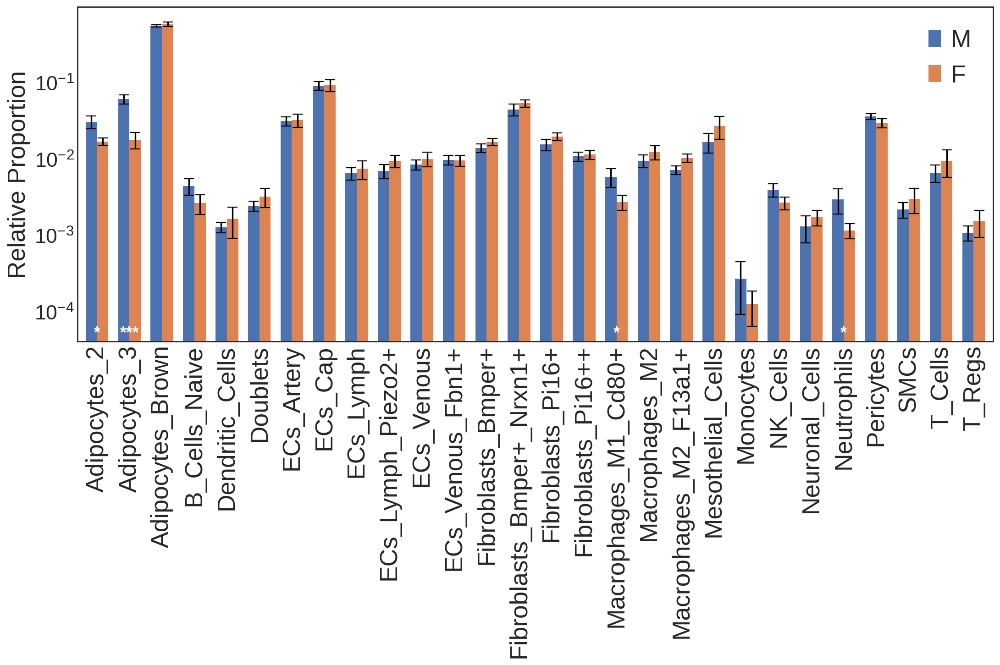

In [57]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata, 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata, 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

### Comparing across mid-level groups

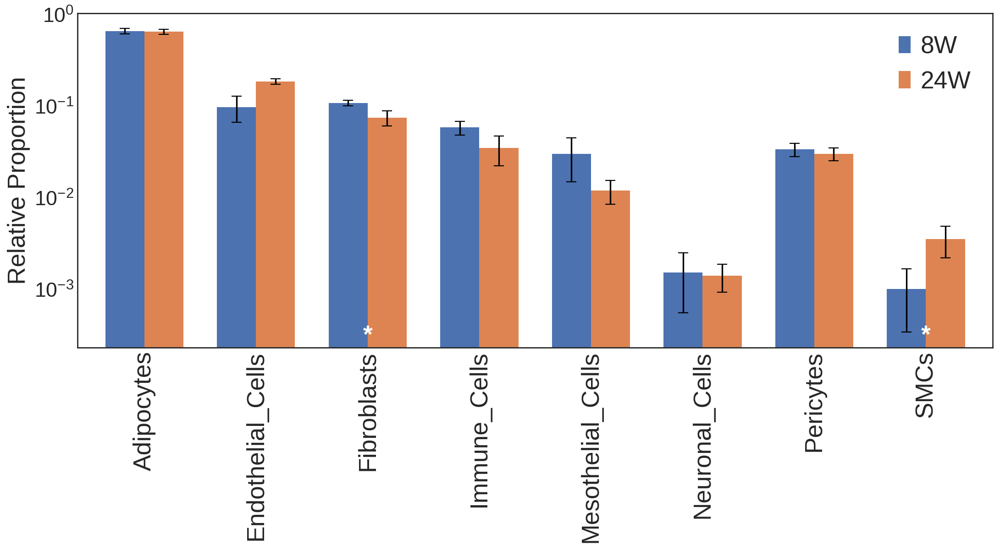

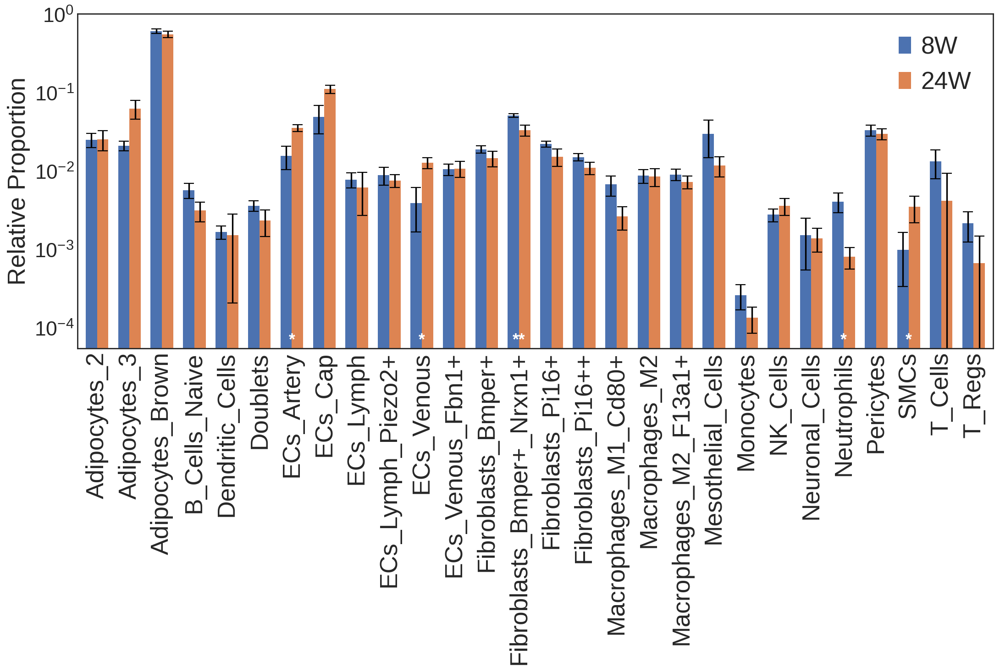

In [58]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.diet == 'HF'], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.diet == 'HF'], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

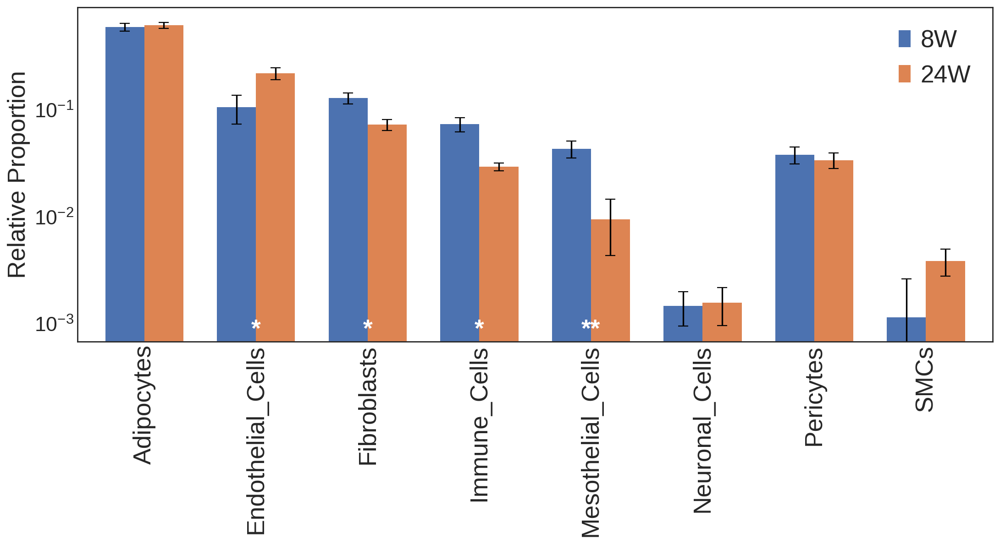

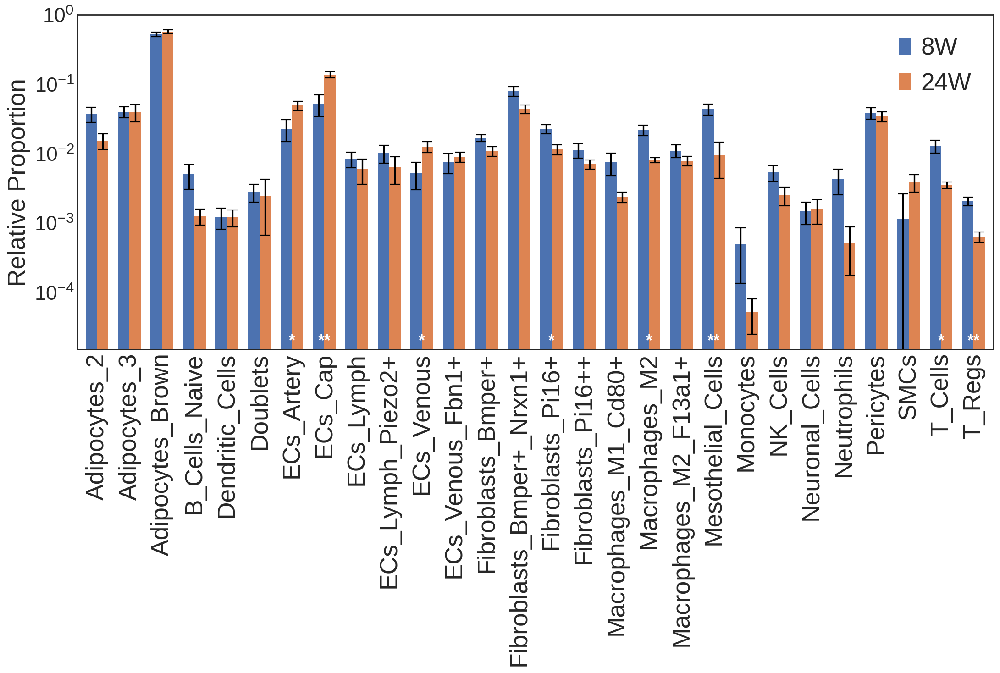

In [59]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.diet == 'Control'], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.diet == 'Control'], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

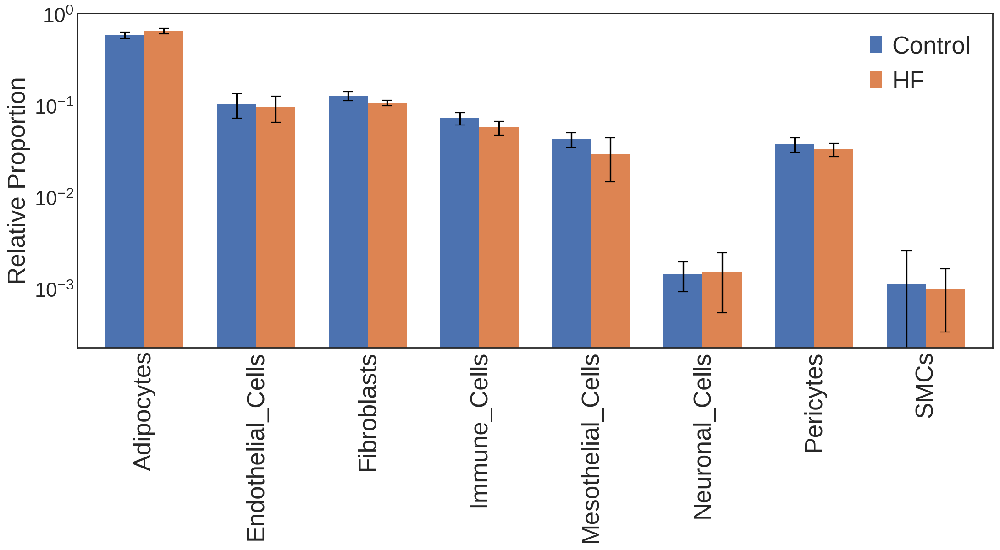

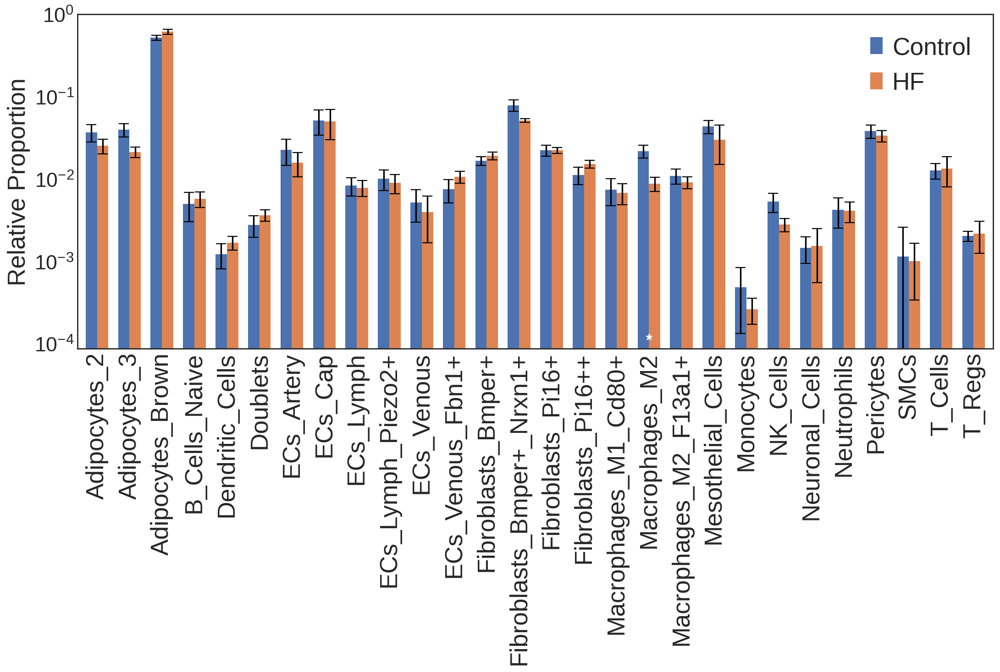

In [60]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.time == '8W'], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.time == '8W'], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

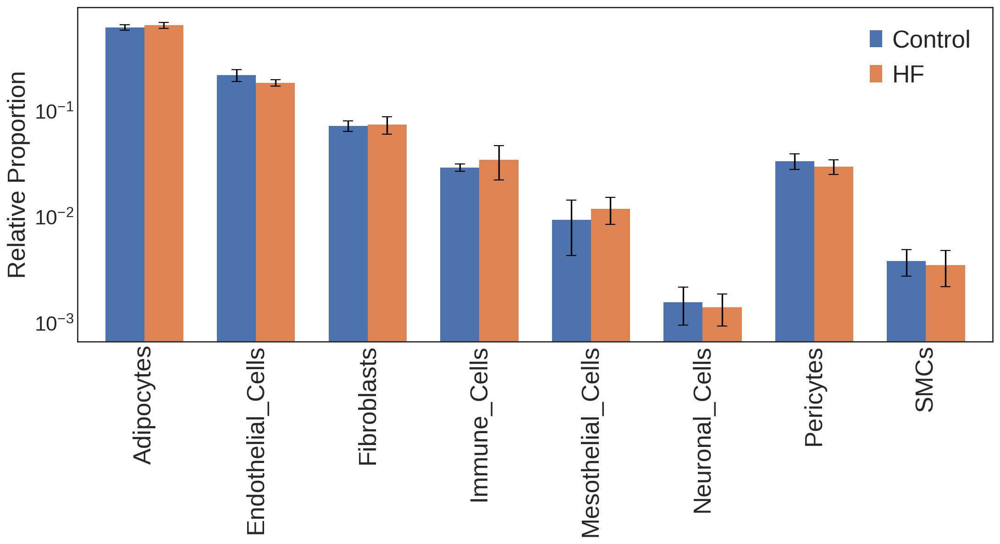

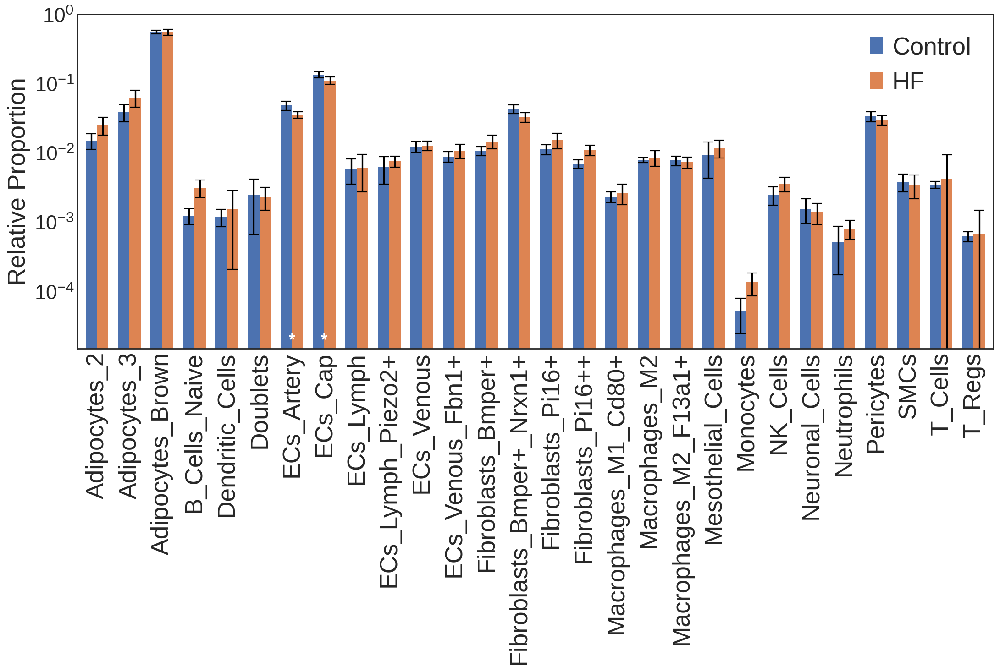

In [61]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.time == '24W'], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.time == '24W'], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

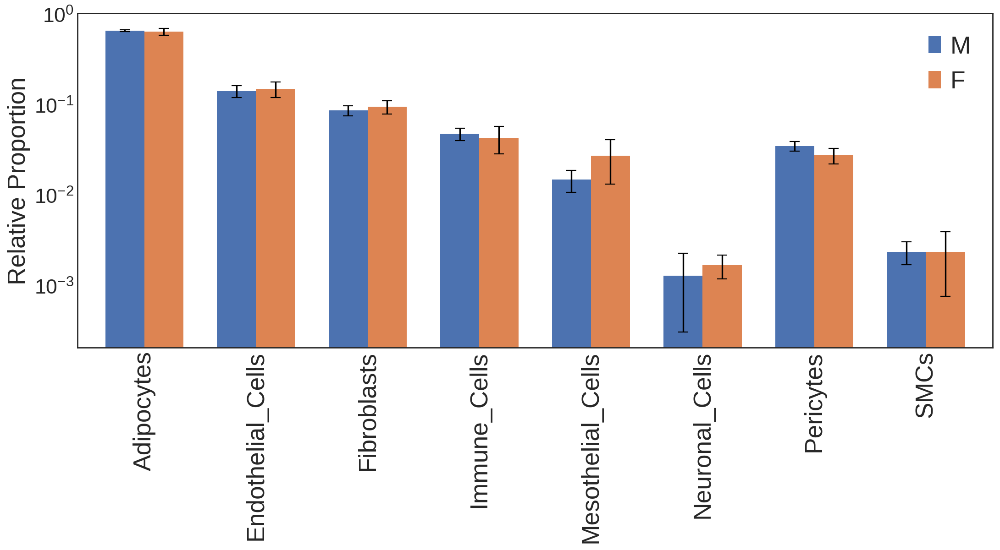

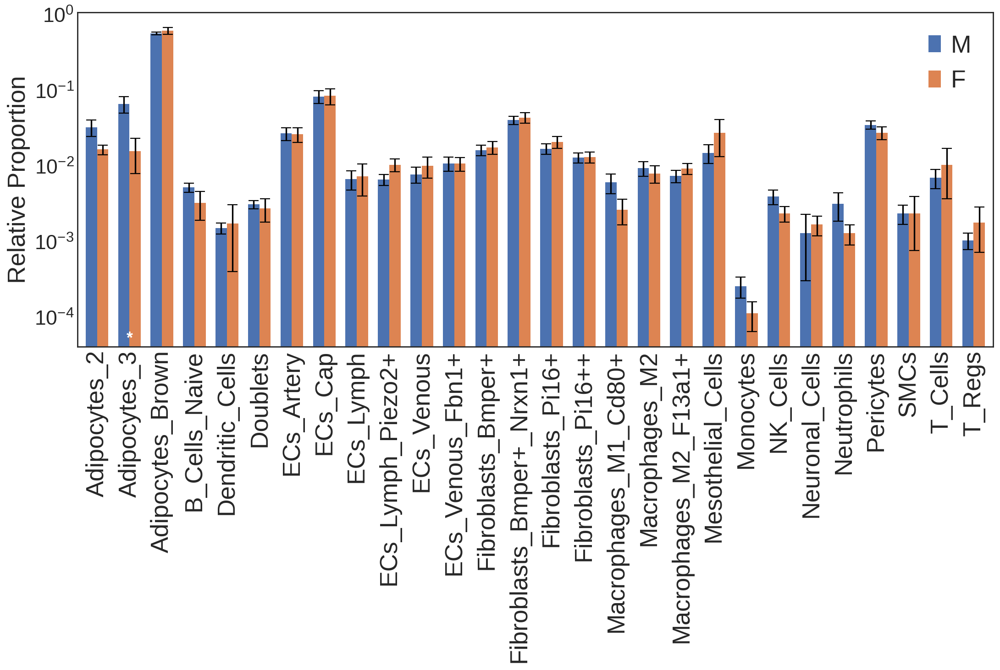

In [62]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.diet == 'HF'], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.diet == 'HF'], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

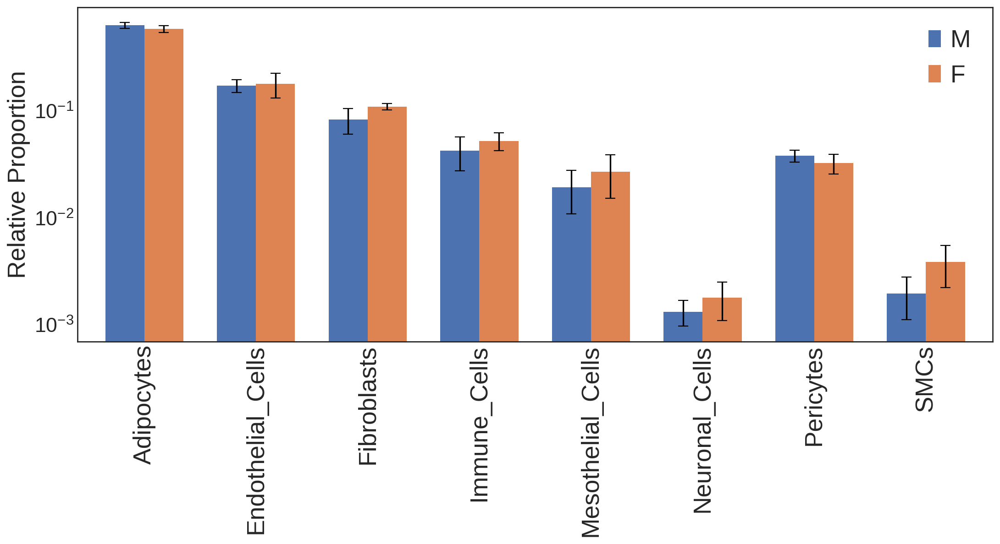

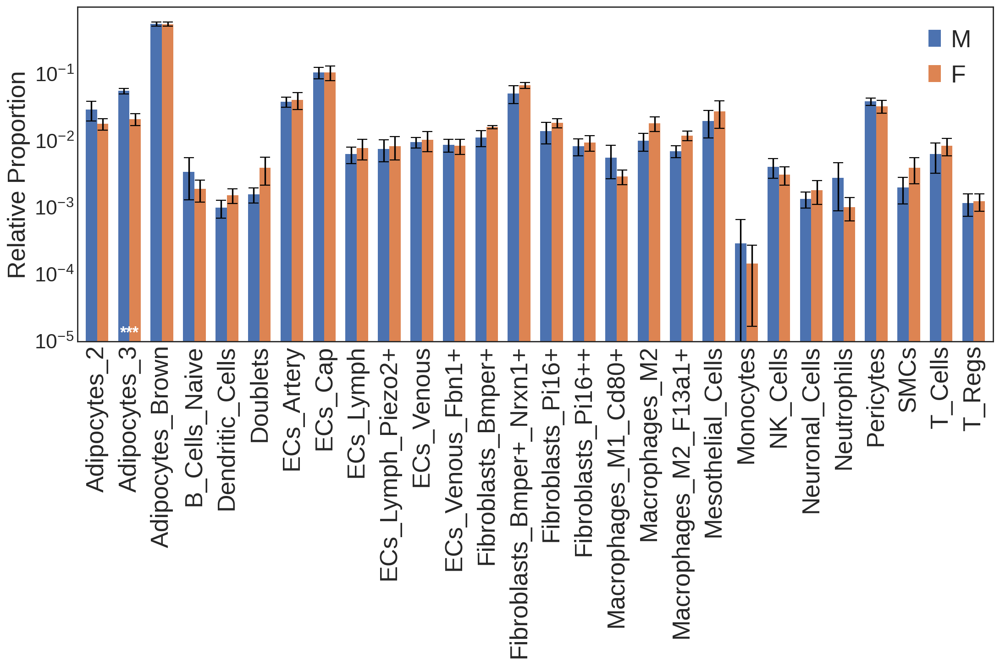

In [63]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.diet == 'Control'], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.diet == 'Control'], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

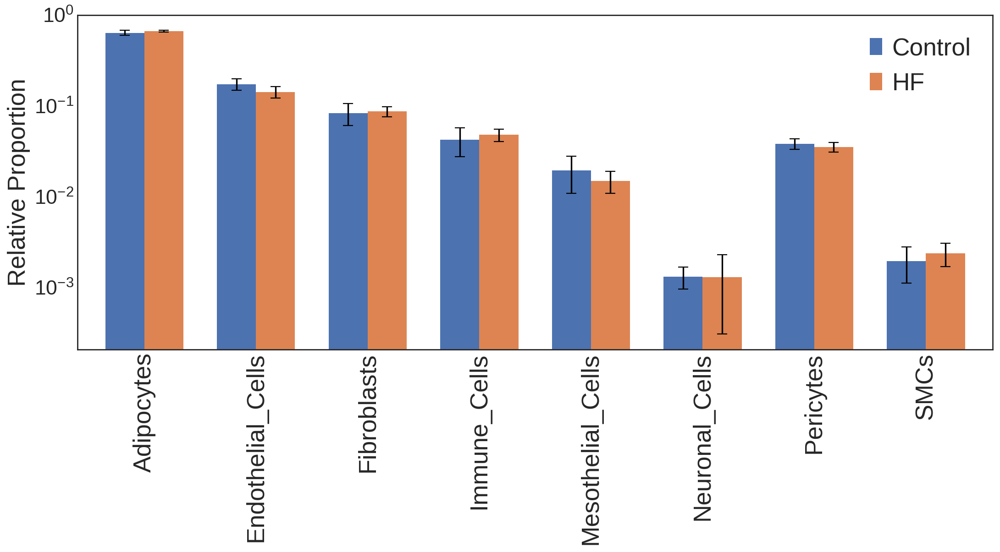

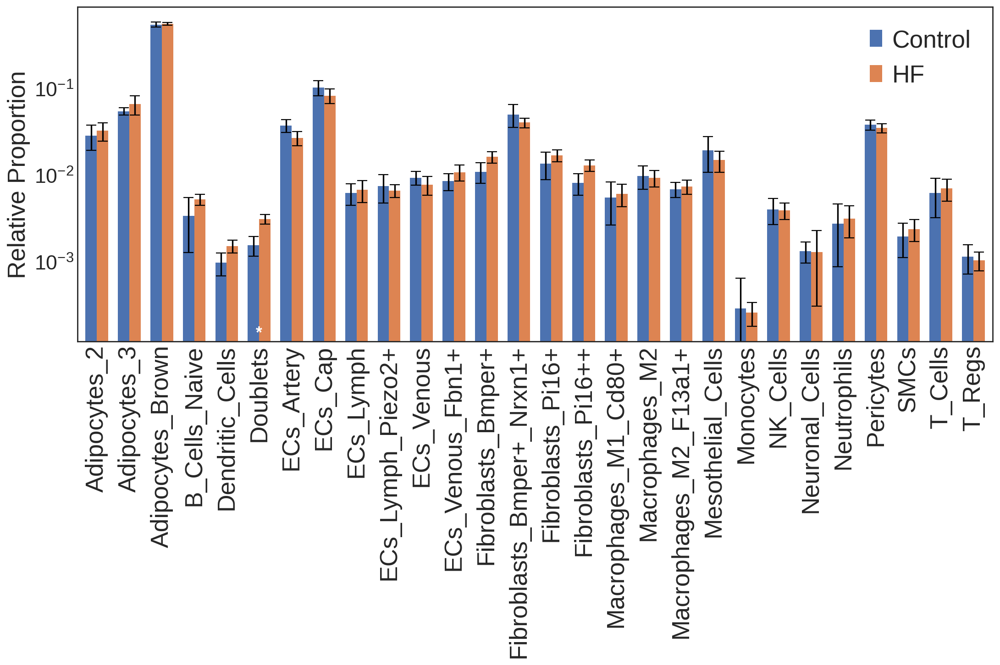

In [64]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.sex == 'M'], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.sex == 'M'], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

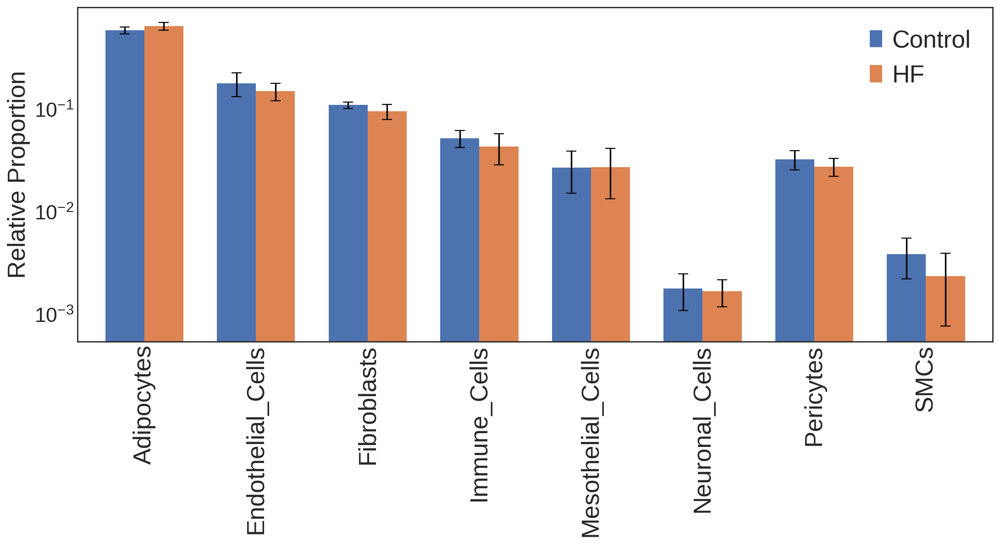

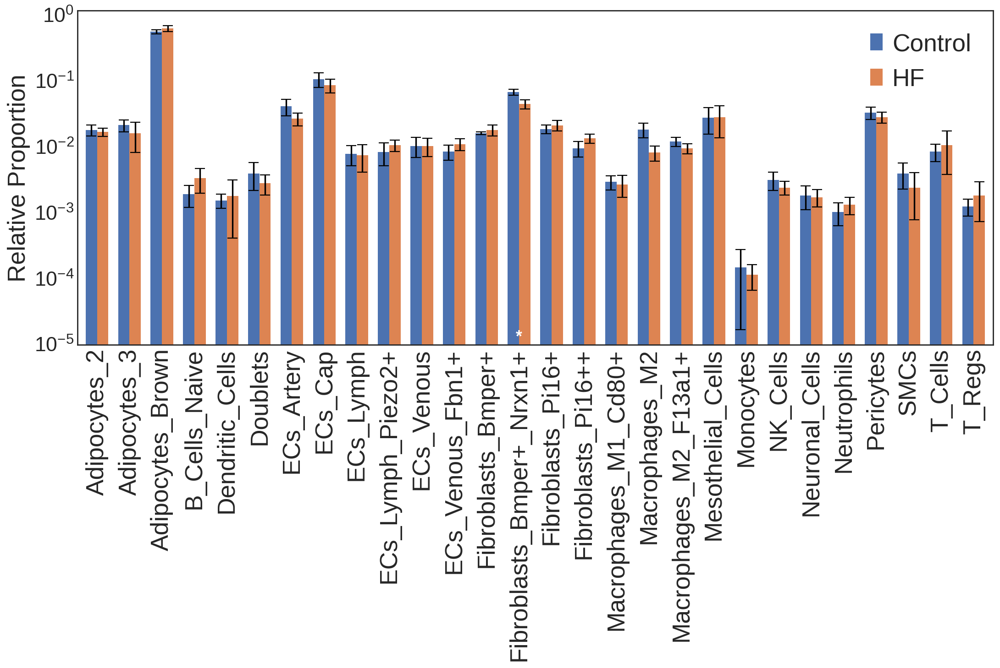

In [65]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.sex == 'F'], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.sex == 'F'], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

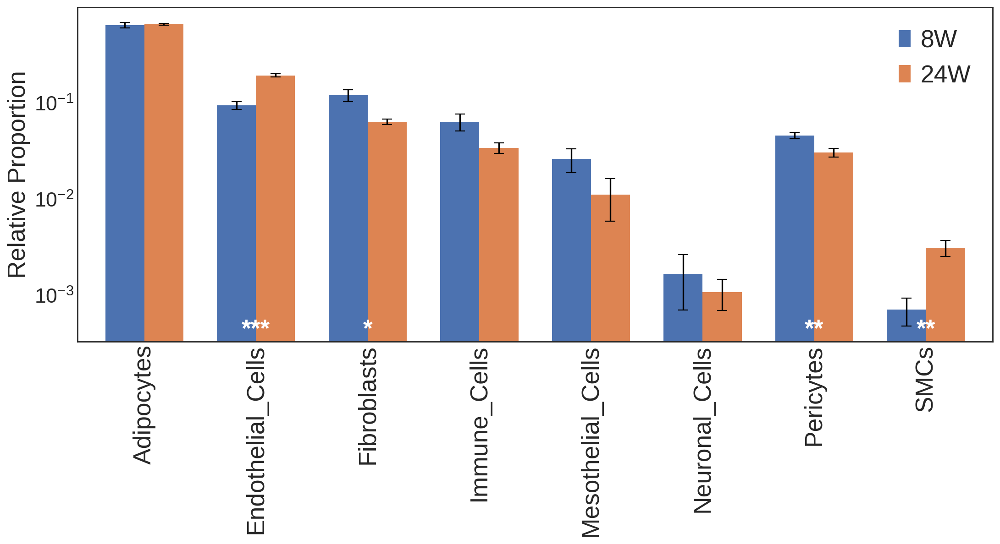

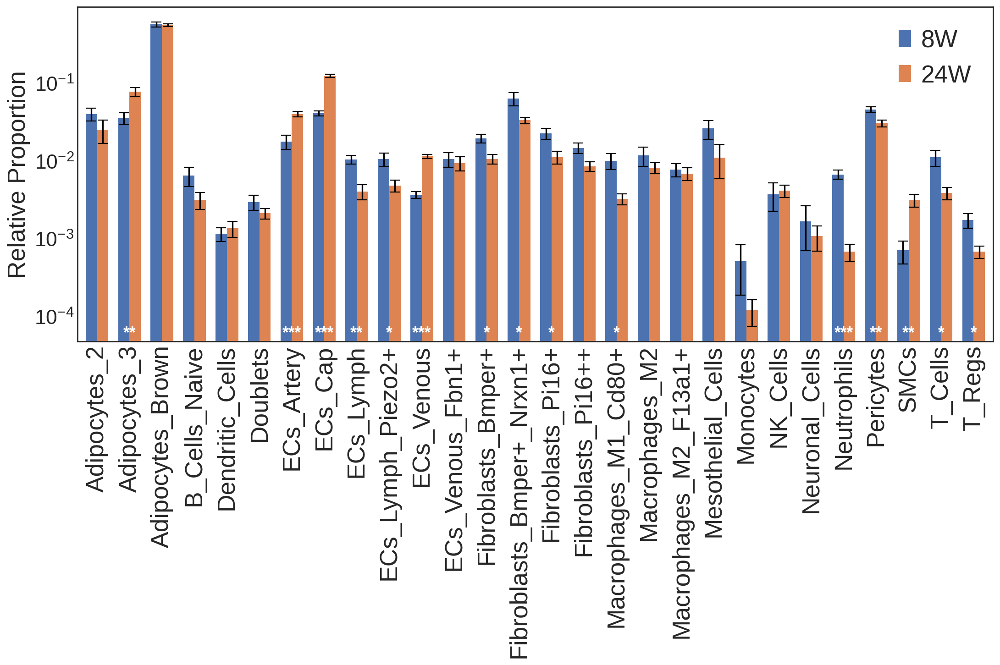

In [66]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.sex == 'M'], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.sex == 'M'], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

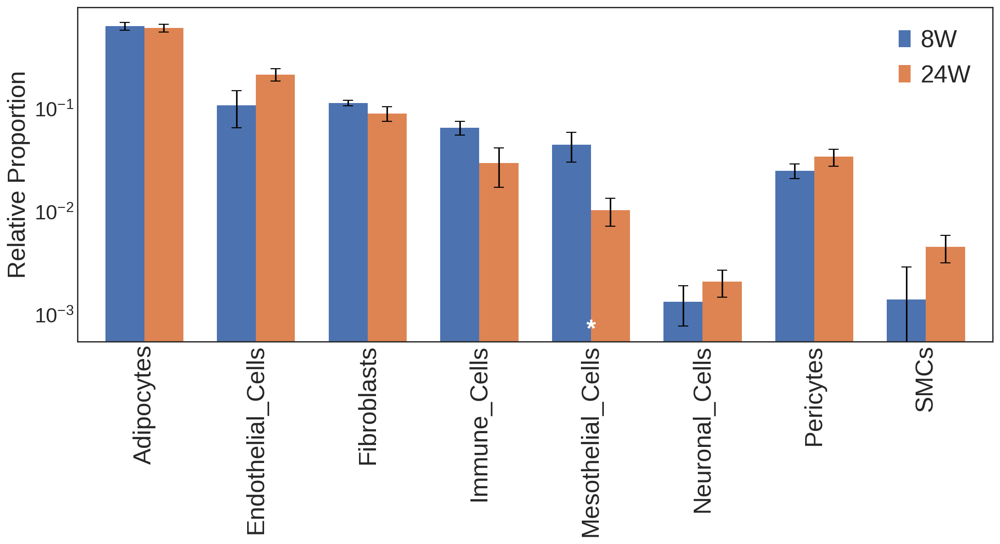

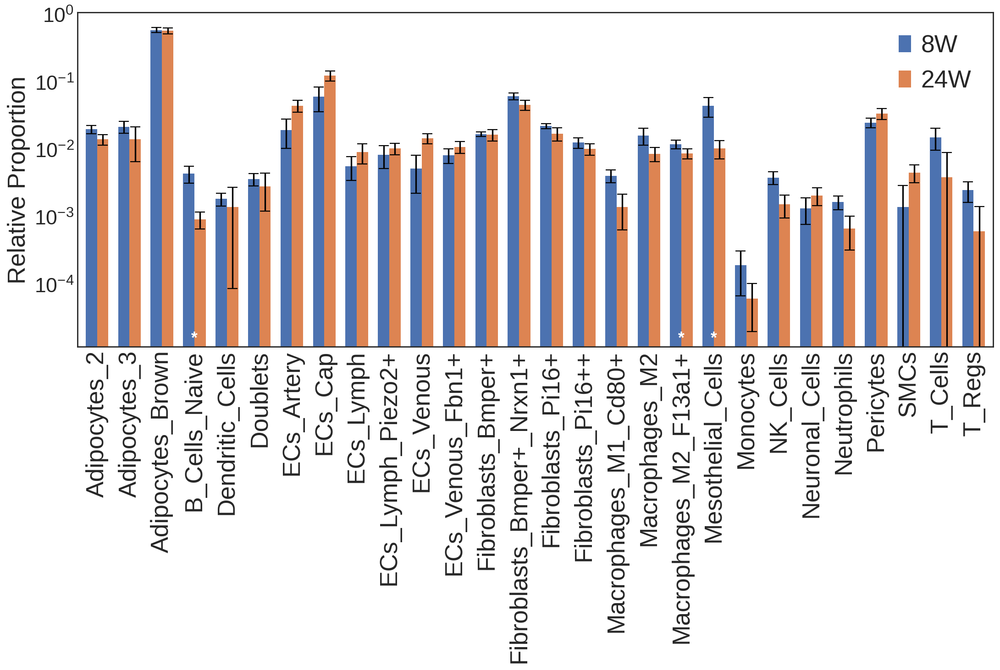

In [67]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.sex == 'F'], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.sex == 'F'], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

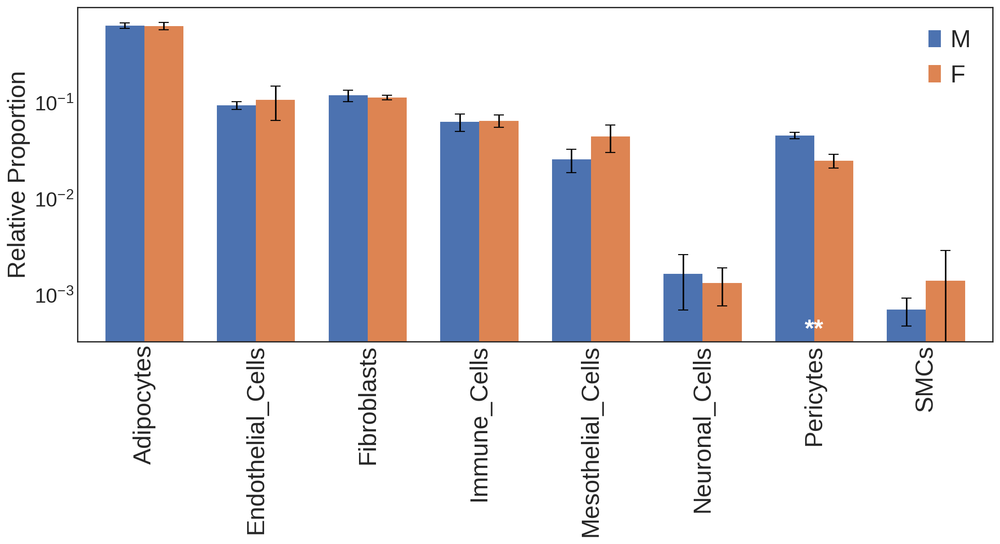

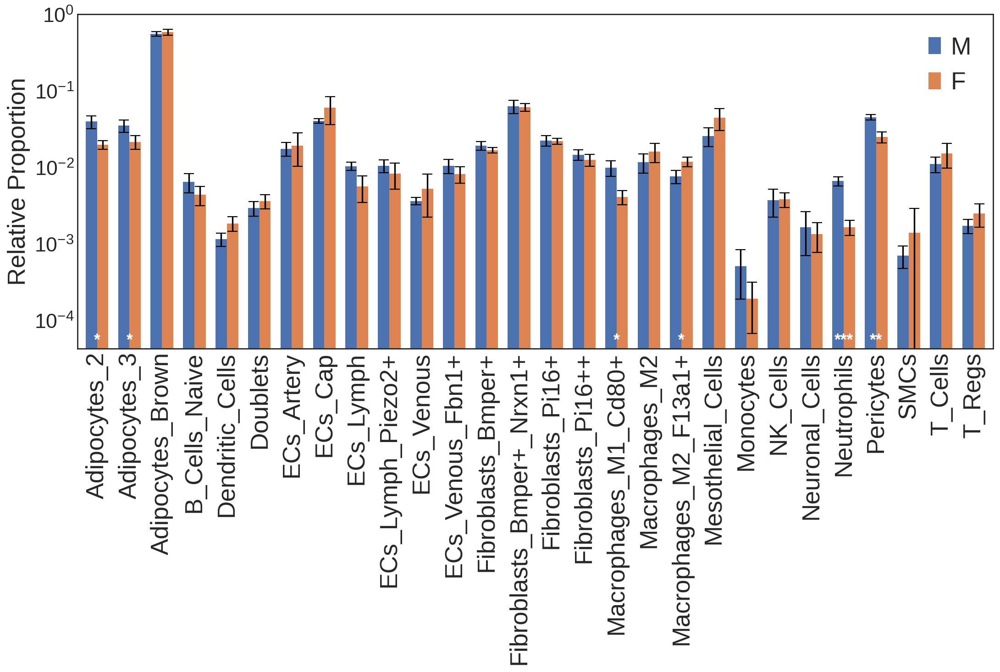

In [68]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.time == '8W'], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.time == '8W'], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

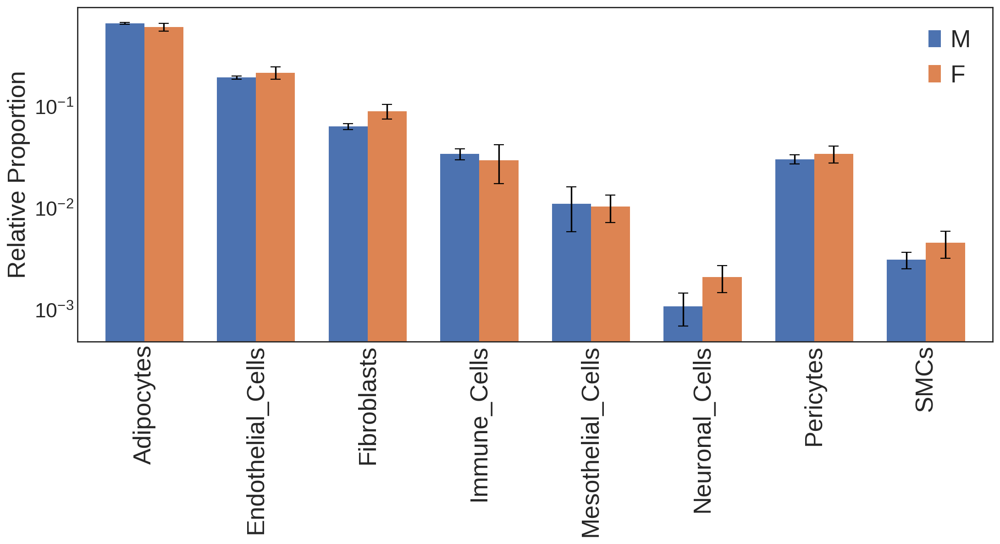

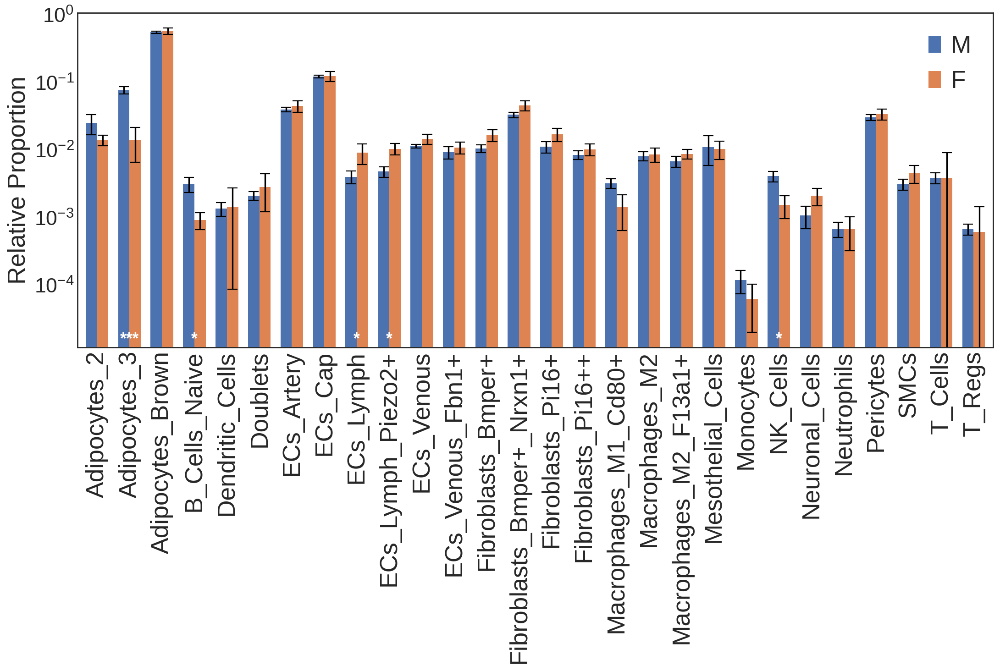

In [69]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.time == '24W'], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.time == '24W'], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

### Comparing across low-level groups

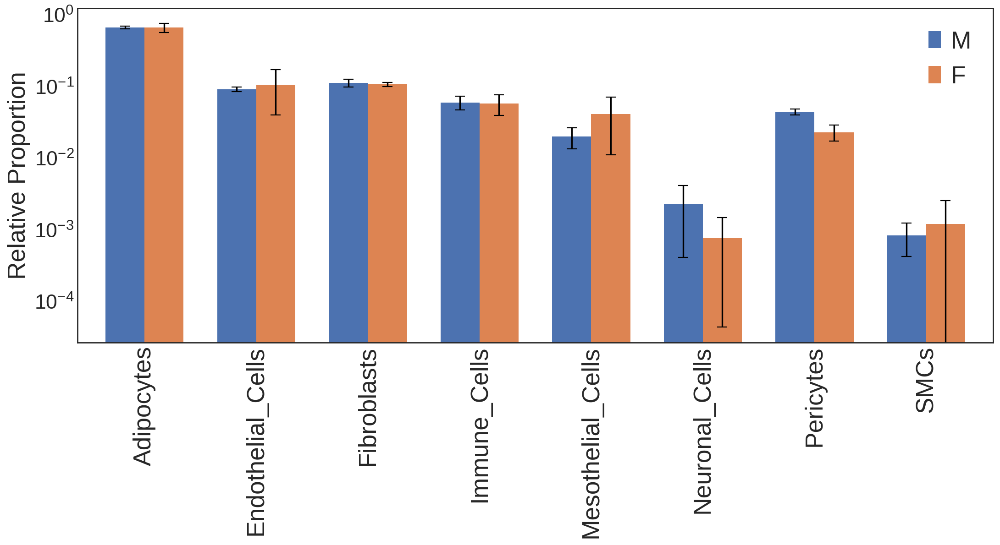

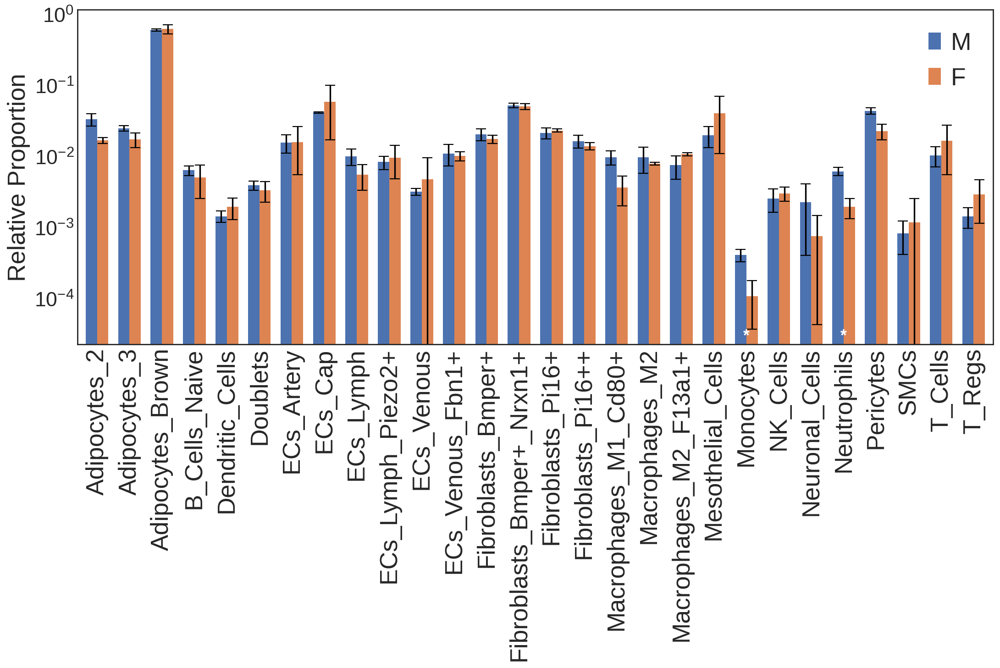

In [70]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.time == '8W') & (adata.obs.diet == 'HF')], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.time == '8W') & (adata.obs.diet == 'HF')], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

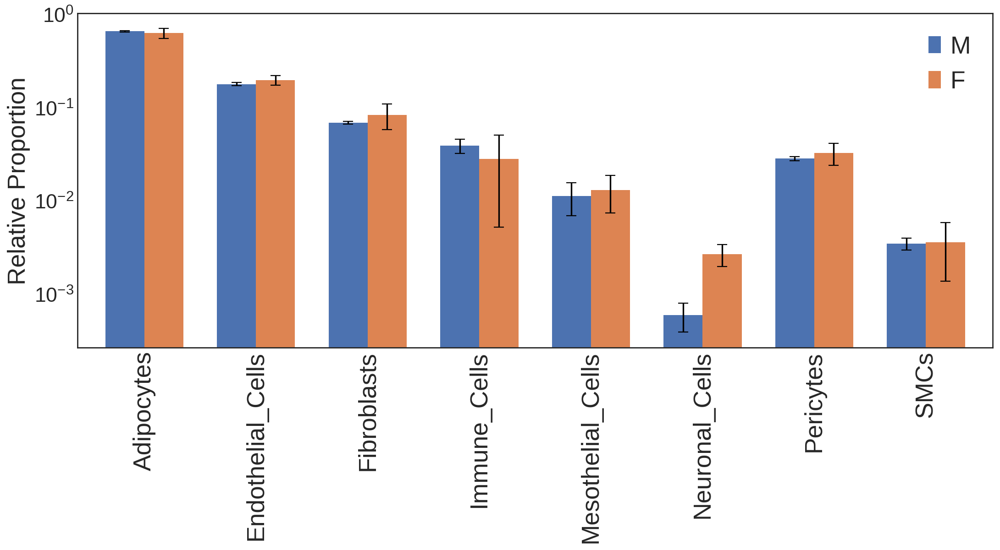

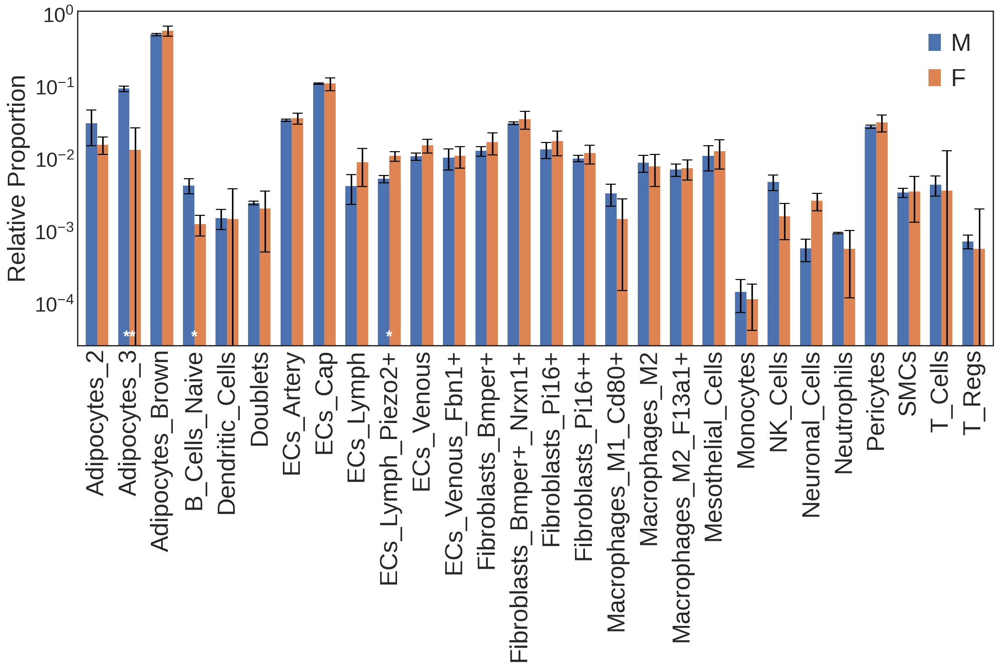

In [71]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.time == '24W') & (adata.obs.diet == 'HF')], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.time == '24W') & (adata.obs.diet == 'HF')], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

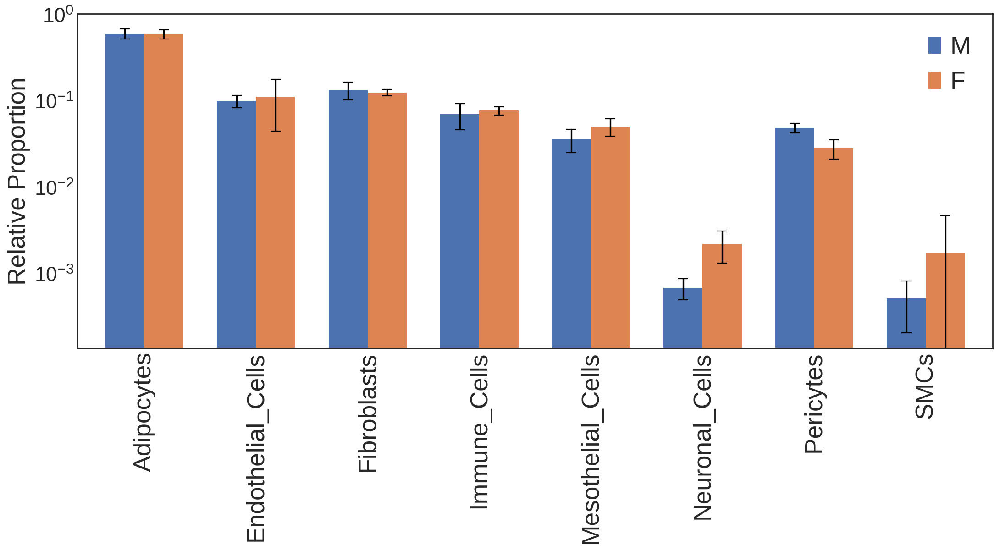

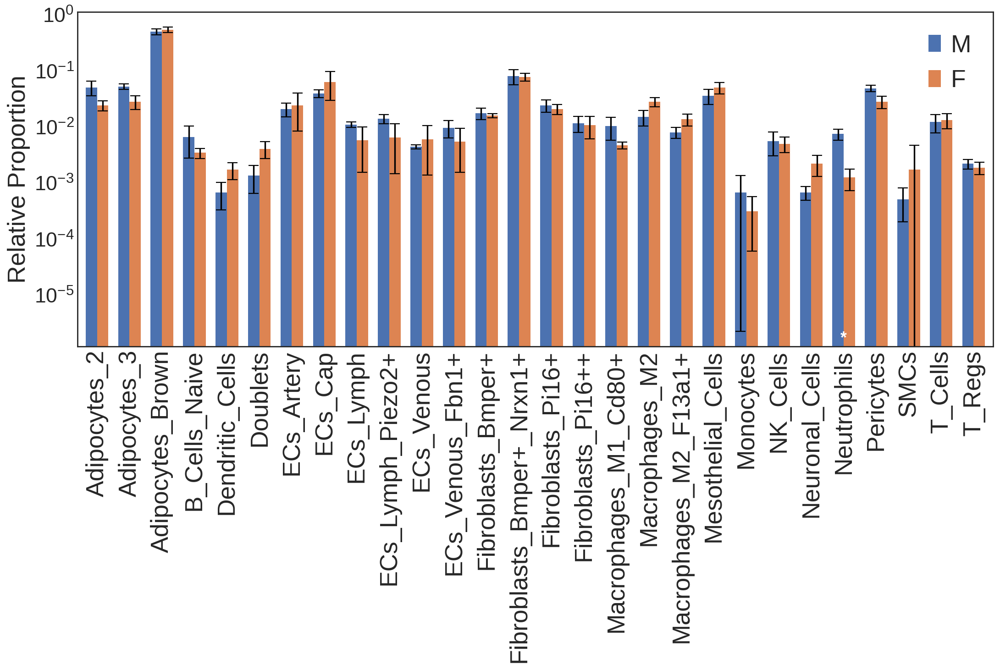

In [72]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.time == '8W') & (adata.obs.diet == 'Control')], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.time == '8W') & (adata.obs.diet == 'Control')], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

group2 does not contain Monocytes


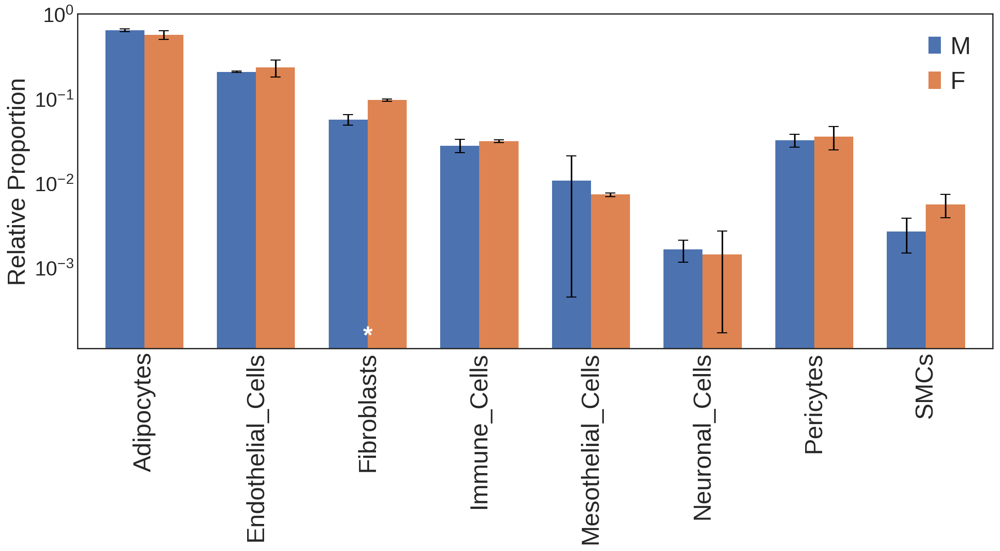

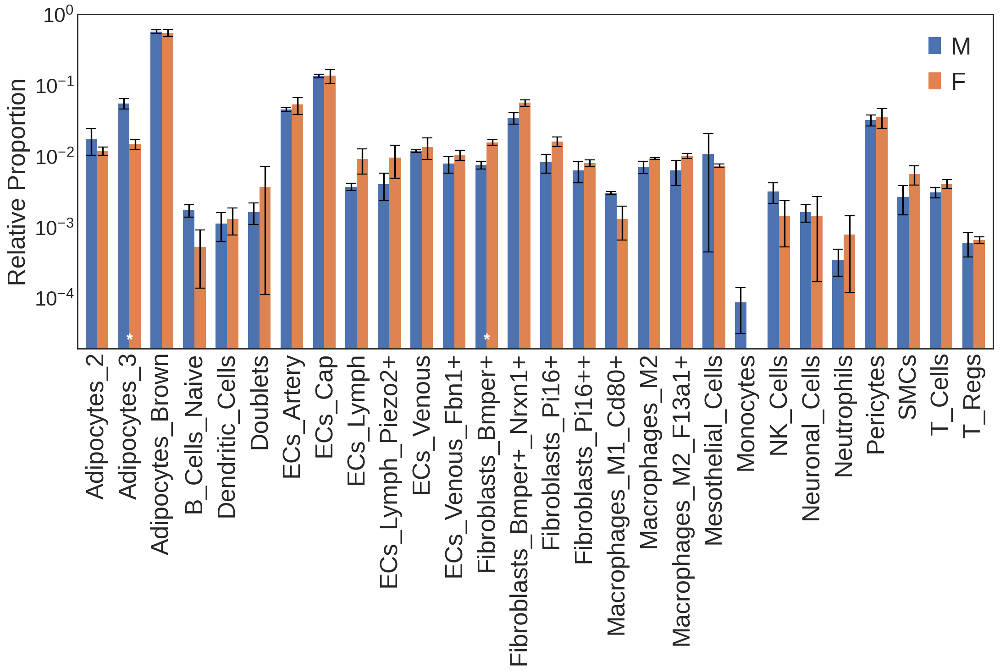

In [88]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.time == '24W') & (adata.obs.diet == 'Control')], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.time == '24W') & (adata.obs.diet == 'Control')], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

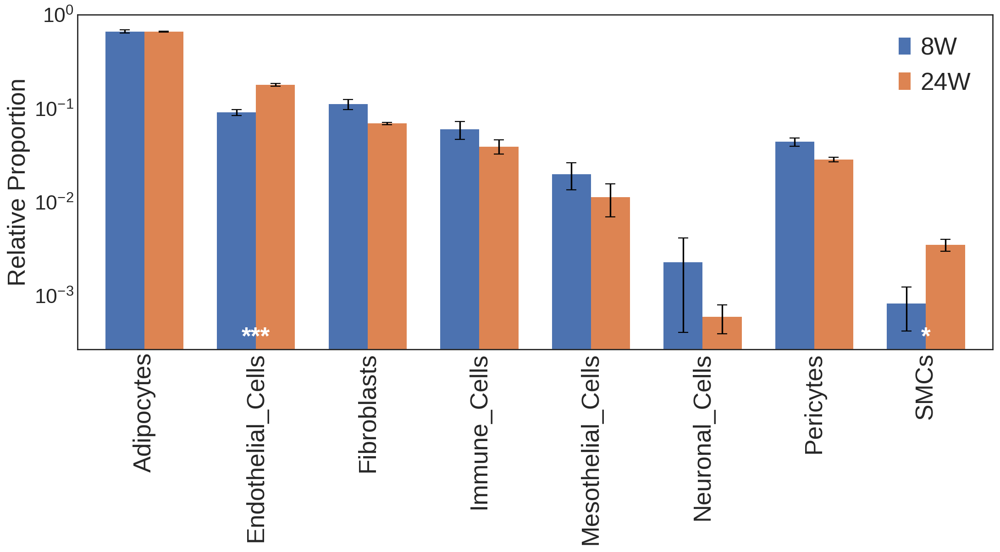

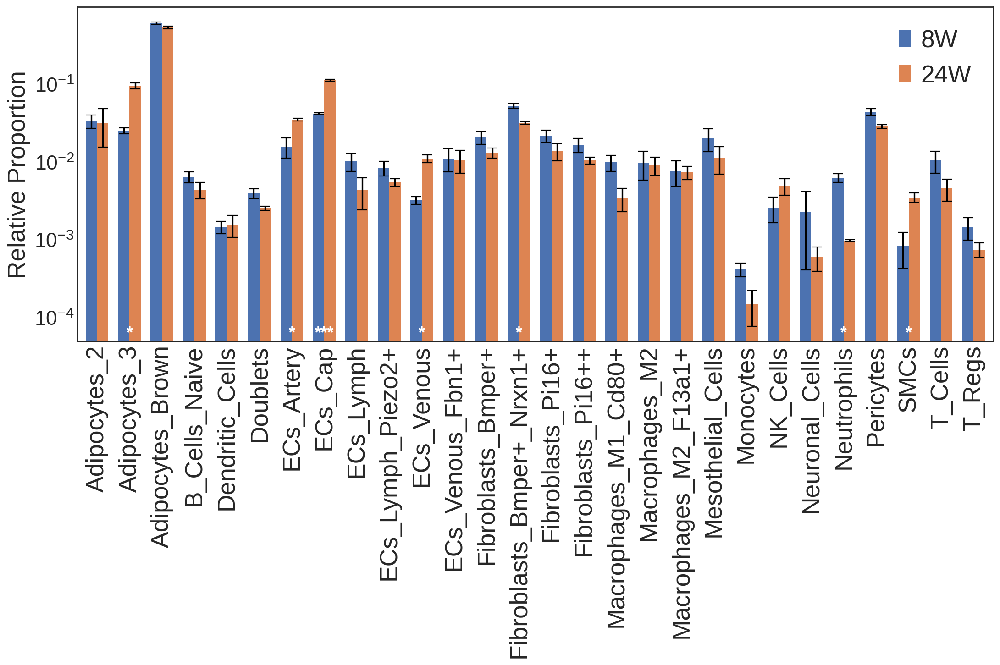

In [89]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'M') & (adata.obs.diet == 'HF')], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'M') & (adata.obs.diet == 'HF')], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

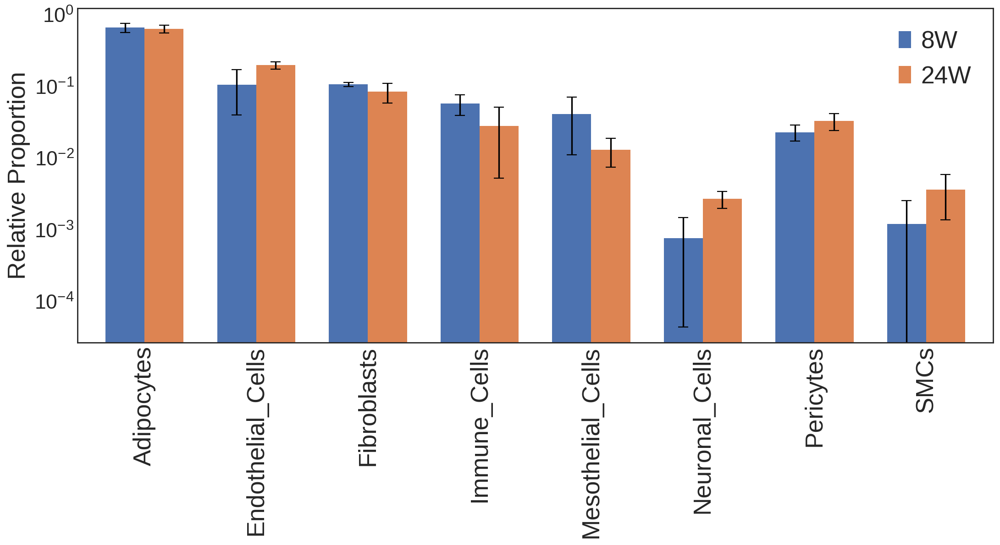

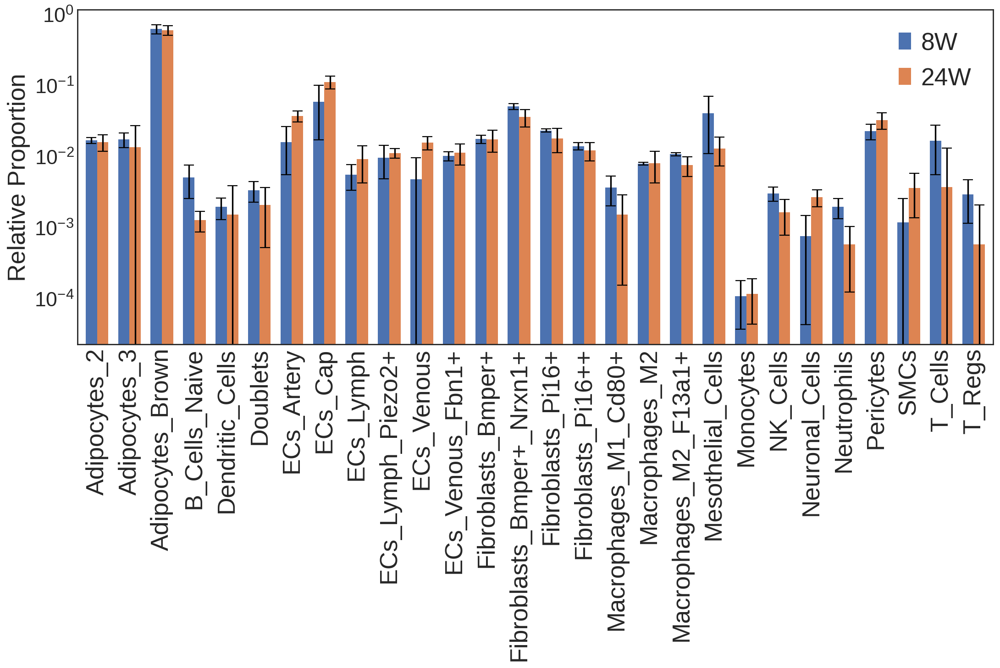

In [90]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'F') & (adata.obs.diet == 'HF')], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'F') & (adata.obs.diet == 'HF')], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

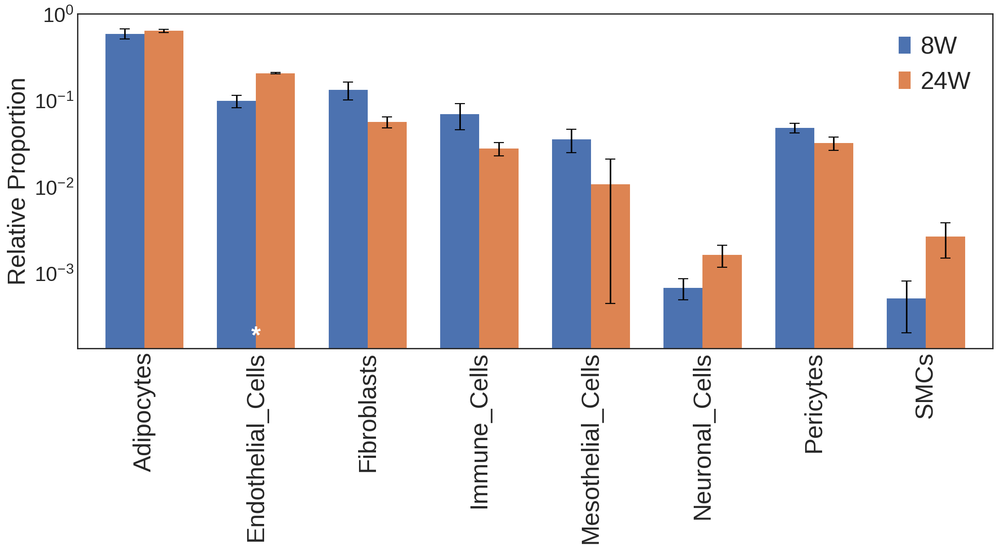

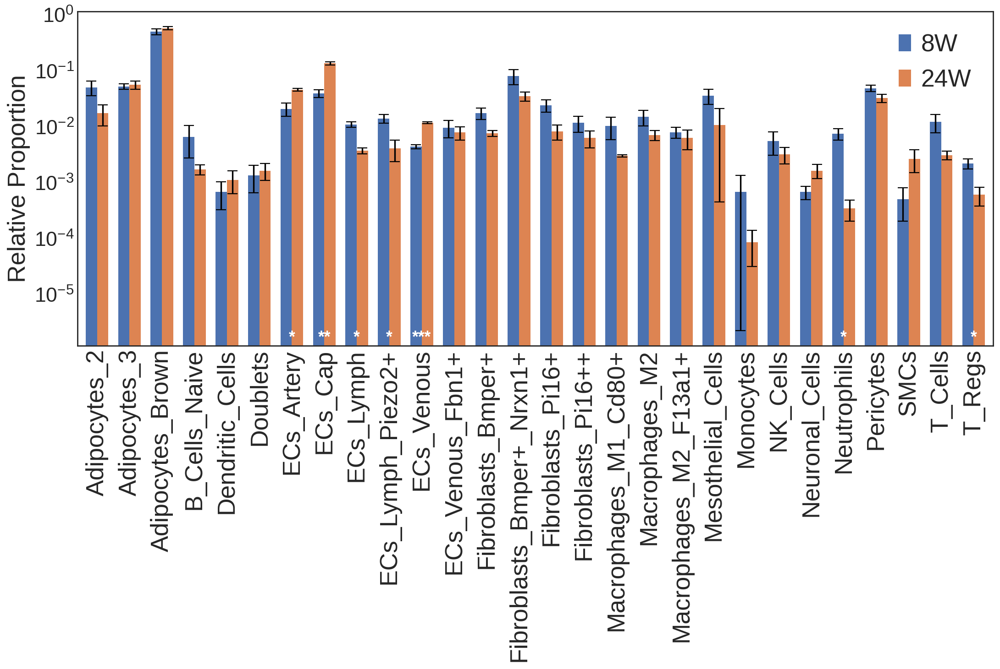

In [91]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'M') & (adata.obs.diet == 'Control')], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'M') & (adata.obs.diet == 'Control')], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

group2 does not contain Monocytes


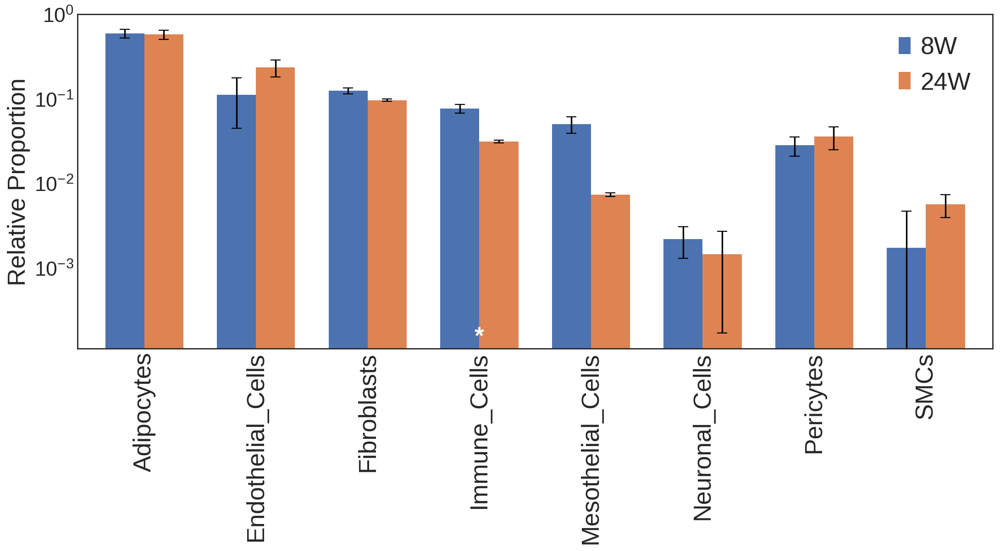

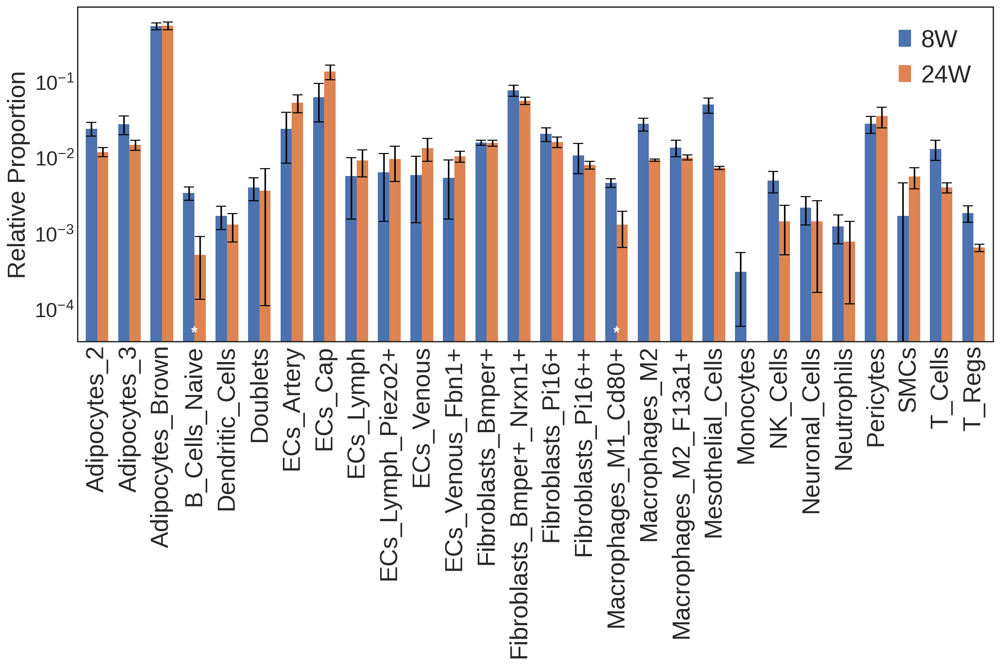

In [92]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'F') & (adata.obs.diet == 'Control')], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'F') & (adata.obs.diet == 'Control')], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

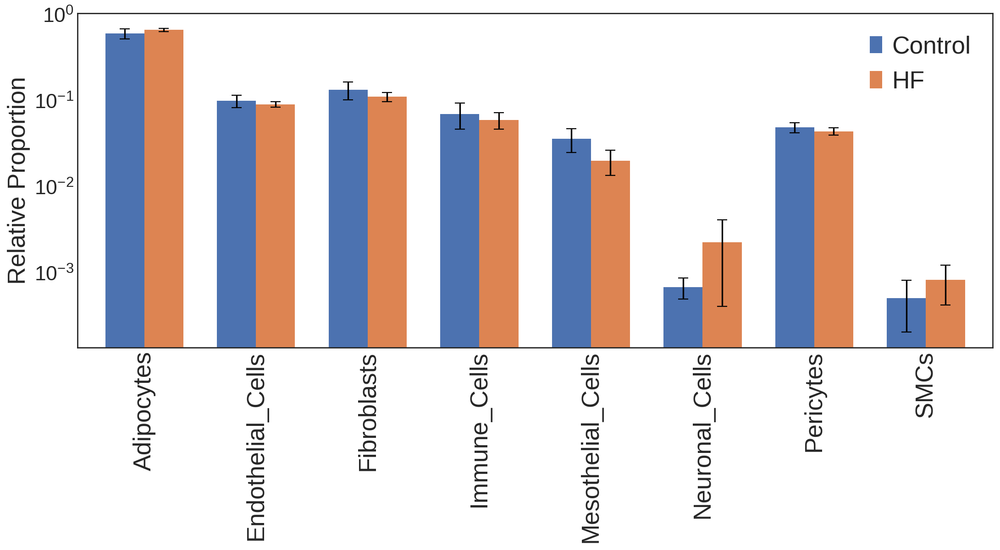

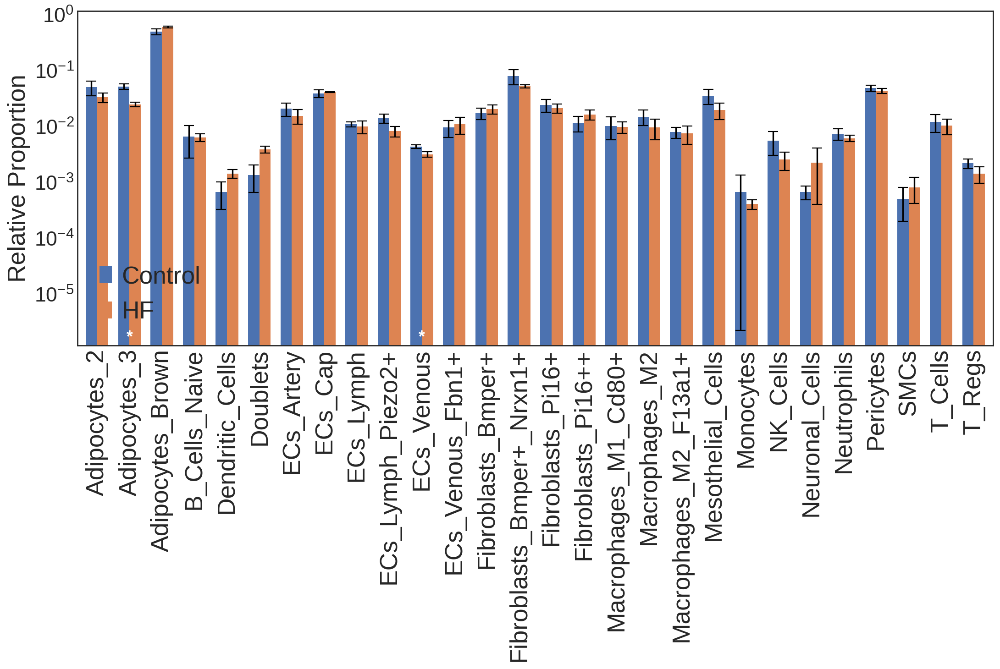

In [93]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'M') & (adata.obs.time == '8W')], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'M') & (adata.obs.time == '8W')], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

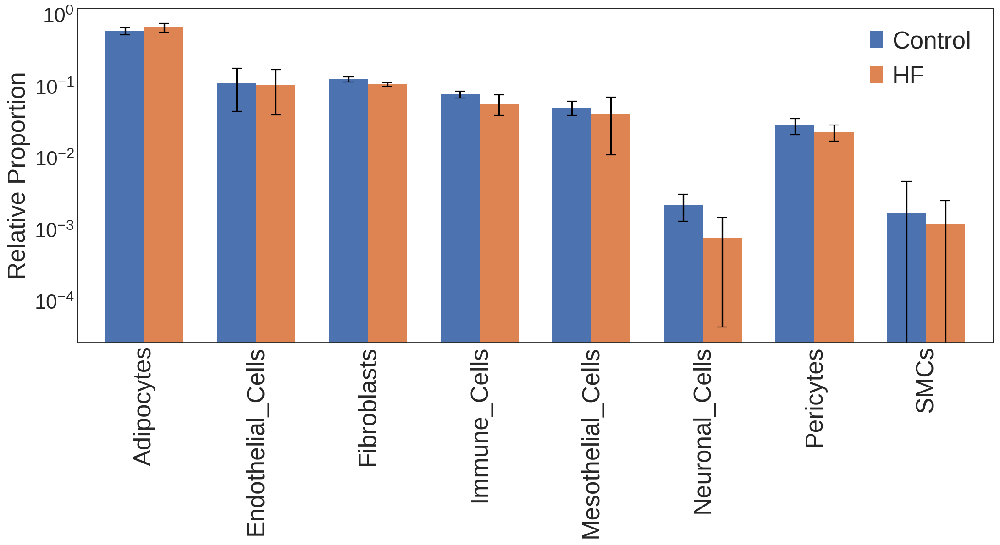

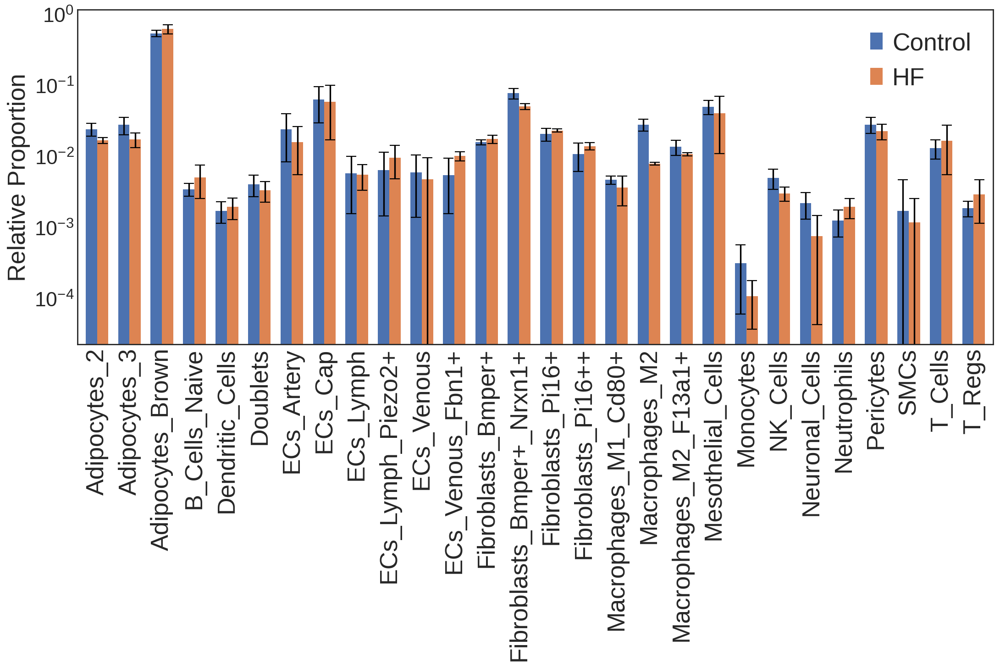

In [94]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'F') & (adata.obs.time == '8W')], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'F') & (adata.obs.time == '8W')], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

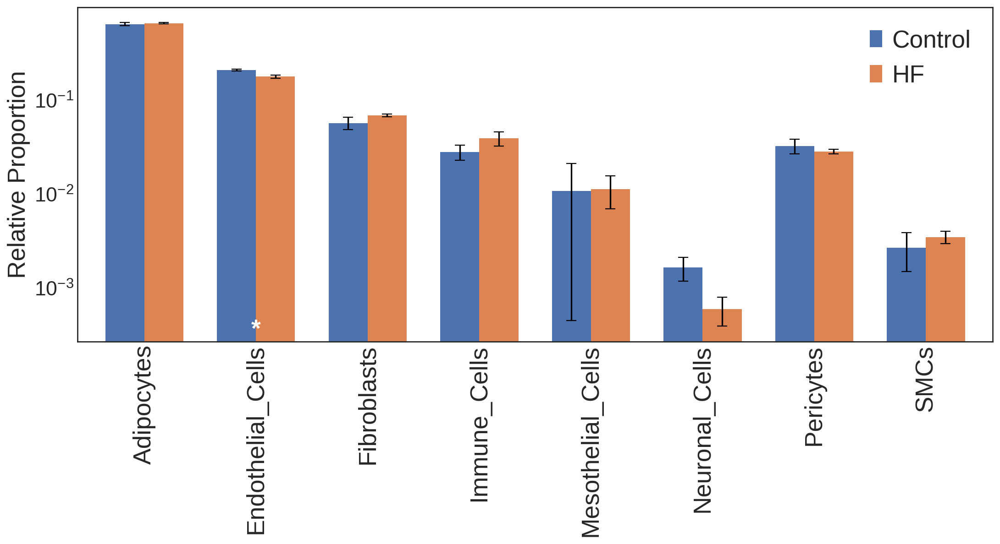

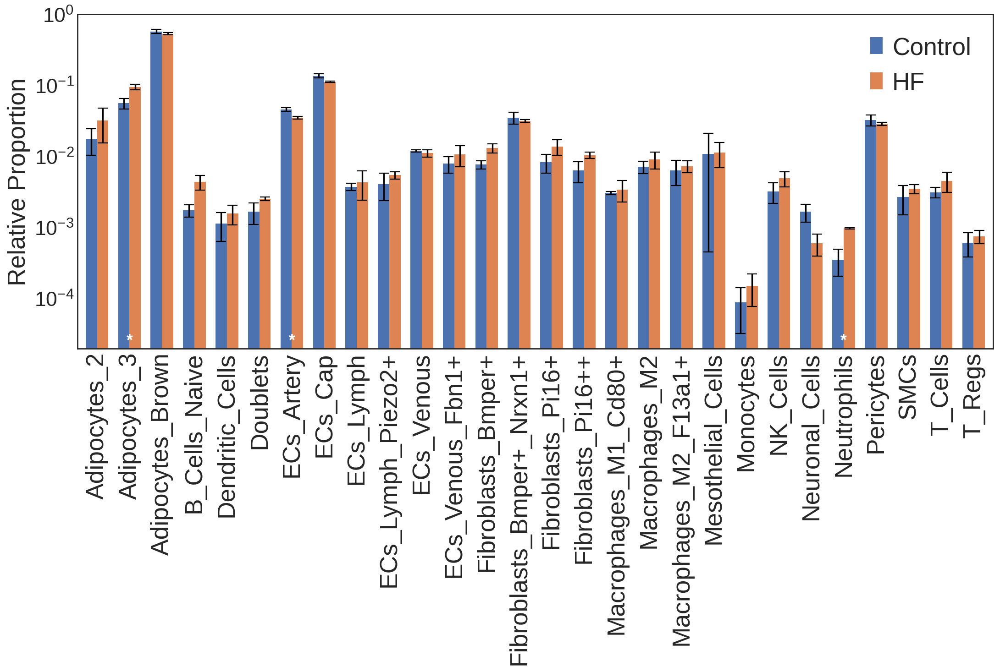

In [95]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'M') & (adata.obs.time == '24W')], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'M') & (adata.obs.time == '24W')], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

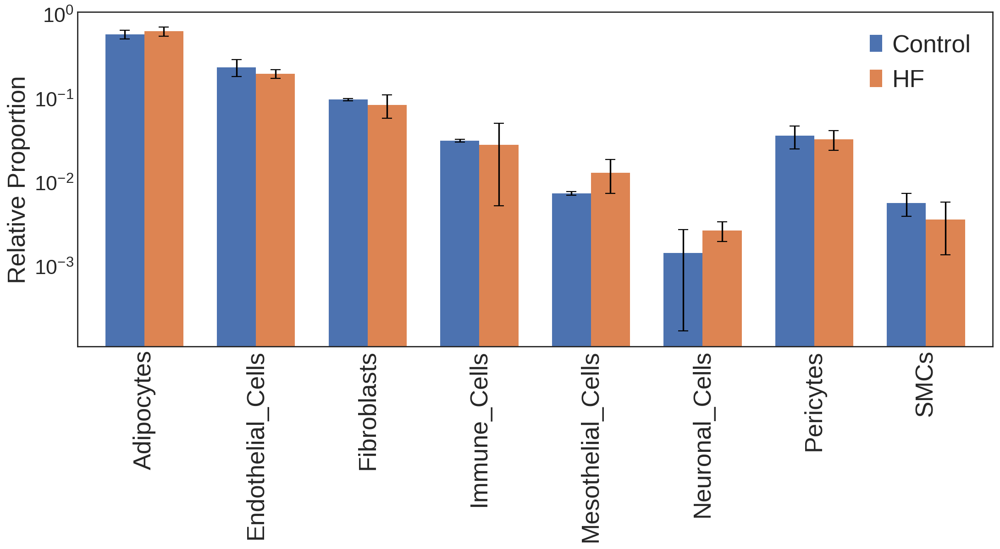

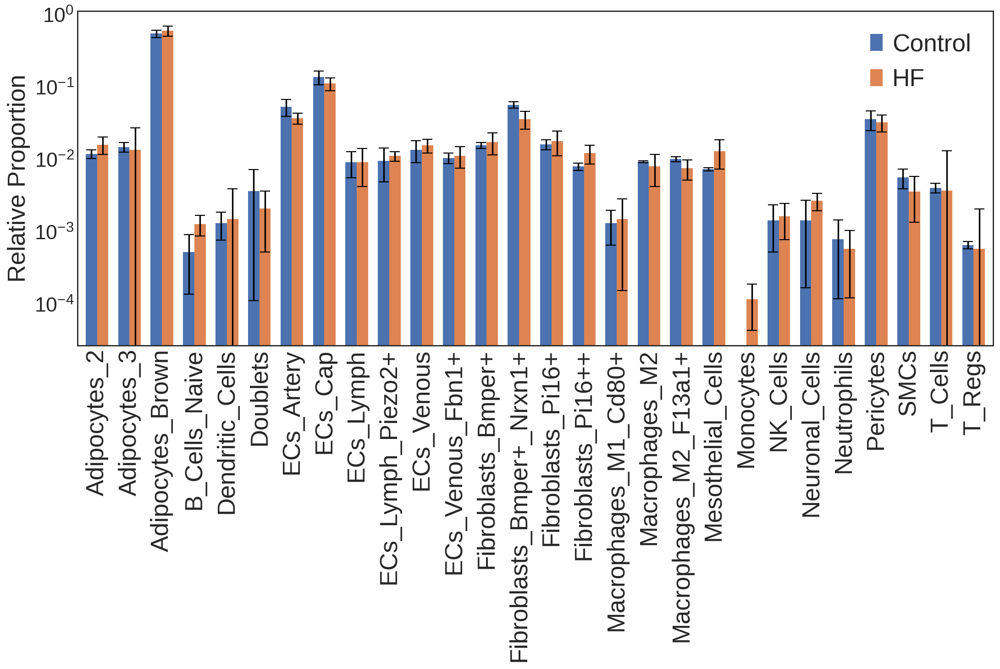

In [96]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'F') & (adata.obs.time == '24W')], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'F') & (adata.obs.time == '24W')], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

## Differences between proportions (meta-comparisons)

In [4]:
df_len = len(adata.obs.sample_id.unique()) * len(adata.obs.celltype_broad.unique())
df = pd.DataFrame(index=range(df_len),
                  columns = ['sample_id', 'tissue', 'diet', 'time', 'sex', 'celltype', 'celltype_number', 'total_number'])

i = 0
for sample_id in adata.obs.sample_id.unique():
    df_sample = adata.obs[adata.obs.sample_id == sample_id]
    for celltype in adata.obs.celltype_broad.unique():
            df.sample_id.iloc[i] = sample_id
            df.celltype.iloc[i] = celltype
            df.tissue.iloc[i] = df_sample.tissue.iloc[0]
            df.diet.iloc[i] = df_sample.diet.iloc[0]
            df.time.iloc[i] = df_sample.time.iloc[0]
            df.sex.iloc[i] = df_sample.sex.iloc[0]
            df.total_number.iloc[i] = len(df_sample)
            df.celltype_number.iloc[i] = len(df_sample[df_sample.celltype_broad == celltype])
            i+=1
df.head()

,sample_id,tissue,diet,time,sex,celltype,celltype_number,total_number
0,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Fibroblasts,383,1936
1,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Adipocytes,913,1936
2,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Immune_Cells,207,1936
3,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Endothelial_Cells,238,1936
4,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Pericytes,119,1936


In [5]:
### Calculate proportion for each row
df['proportion'] = df.celltype_number / df.total_number

# convert columns to numeric
df[["celltype_number", "total_number", "proportion"]] = df[["celltype_number", "total_number", "proportion"]].apply(pd.to_numeric)

df['sample_type'] = df.tissue + '_'+ df.diet + '_' + df.time + '_' + df.sex

df['mean_by_celltype'] = df.groupby(['celltype', 'sample_type'])['proportion'].transform('mean')
df['sem_by_celltype'] = df.groupby(['celltype', 'sample_type'])['proportion'].transform('sem')

df.head()

,sample_id,tissue,diet,time,sex,celltype,celltype_number,total_number,proportion,sample_type,mean_by_celltype,sem_by_celltype
0,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Fibroblasts,383,1936,0.197831,taPVAT_Control_8W_M,0.139554,0.031597
1,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Adipocytes,913,1936,0.471591,taPVAT_Control_8W_M,0.584616,0.082261
2,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Immune_Cells,207,1936,0.106921,taPVAT_Control_8W_M,0.077689,0.023747
3,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Endothelial_Cells,238,1936,0.122934,taPVAT_Control_8W_M,0.105897,0.016475
4,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Pericytes,119,1936,0.061467,taPVAT_Control_8W_M,0.050596,0.006435


In [6]:
df_ctrl_m = df[(df.sex == 'M') & (df.diet == 'Control')].reset_index() ###Includes both 8W and 24W data
df_hf_m = df[(df.sex == 'M') & (df.diet == 'HF')].reset_index()
df_ctrl_f = df[(df.sex == 'F') & (df.diet == 'Control')].reset_index()
df_hf_f = df[(df.sex == 'F') & (df.diet == 'HF')].reset_index()

In [7]:
def make_df_diff(df, group, group1, group2, sample_type_name):
    df_diff = pd.DataFrame(index=range(8), columns = ['sample_type', 'celltype', 'prop_diff', 'se', 'dof'])
    
    i = 0
    for celltype in df.celltype.unique():
        df_x = df[(df.celltype == celltype) & (df[group] == group1)]
        df_y = df[(df.celltype == celltype) & (df[group] == group2)]

        prop1 = df_x.mean_by_celltype.values[0]
        prop2 = df_y.mean_by_celltype.values[0]
        prop_diff = prop2 - prop1 ###24W - 8W or HF - Control or F - M

        ### standard error of the differences between means calculation
        nx = len(df_x)
        ny = len(df_y)

        s2x = np.var(df_x.proportion.values, ddof = 1)
        s2y = np.var(df_y.proportion.values, ddof = 1)
        
        ### Welch's standard error
        se = (s2x/nx + s2y/ny)**(0.5)
        results = stats.ttest_ind(df_x.proportion.values, df_y.proportion.values, equal_var = False)

        ### Add data to the dataframe
        df_diff.iloc[i, 0] = sample_type_name
        df_diff.iloc[i, 1] = celltype
        df_diff.iloc[i, 2] = prop_diff
        df_diff.iloc[i, 3] = se
        df_diff.iloc[i, 4] = results.df
        i += 1
    return df_diff

In [8]:
df_diff_ctrl_m = make_df_diff(df_ctrl_m, 'time', '8W', '24W', 'taPVAT_Control_M_(24W-8W)')
df_diff_hf_m = make_df_diff(df_hf_m, 'time', '8W', '24W', 'taPVAT_HF_M_(24W-8W)')
df_diff_ctrl_f = make_df_diff(df_ctrl_f, 'time', '8W', '24W', 'taPVAT_Control_F_(24W-8W)')
df_diff_hf_f = make_df_diff(df_hf_f, 'time', '8W', '24W', 'taPVAT_HF_F_(24W-8W)')

In [9]:
df_comb = pd.concat([df_diff_ctrl_m, df_diff_hf_m, df_diff_ctrl_f, df_diff_hf_f], ignore_index= True)

In [27]:
p_list = []
i = 0
j = 16
for celltype in df_comb_sorted.celltype.unique():
    ### Standard Error of the Difference Between Differences
    se_diff_m = (df_comb_sorted.se[i+8]**2 + df_comb_sorted.se[i+24]**2)**(0.5)
    #se_diff_f = (df_comb_sorted.se[j]**2 + df_comb_sorted.se[j+8]**2)**(0.5)
    t_m = (df_comb_sorted.prop_diff[i+8] - df_comb_sorted.prop_diff[i+24])/se_diff_m ###Control - HF. The order doesn't actually matter because it's a two-sided t-test.
    #t_f = (df_comb_sorted.prop_diff[j] - df_comb_sorted.prop_diff[j+8])/se_diff_f
    ### Approximation of the degrees of freedom based on the Welch-Satterthwaite equation.
    dof_m = np.floor((df_comb_sorted.se[i+8]**2 + df_comb_sorted.se[i+24]**2)**2 \
                   / ((df_comb_sorted.se[i+8]**4 / df_comb_sorted.dof[i+8]) + (df_comb_sorted.se[i+24]**4 / df_comb_sorted.dof[i+24])))
    # dof_f = np.floor((df_comb_sorted.se[j]**2 + df_comb_sorted.se[j+8]**2)**2 \
    #                / ((df_comb_sorted.se[j]**4 / df_comb_sorted.dof[j]) + (df_comb_sorted.se[j+8]**4 / df_comb_sorted.dof[j+8])))
    p_val_m = stats.t.sf(abs(t_m), dof_m) * 2
    #p_val_f = stats.t.sf(abs(t_f), dof_f) * 2
    p_list.append(p_val_m)
    #p_list.append(p_val_f)
    print(celltype)
    print(i)
    #print(j)
    print(df_comb_sorted.sample_type[i] + ' , ' + df_comb_sorted.celltype[i])
    #print(df_comb_sorted.sample_type[j] + ' , ' + df_comb_sorted.celltype[j])
    print(df_comb_sorted.sample_type[i+16] + ' , ' + df_comb_sorted.celltype[i+16])
    #print(df_comb_sorted.sample_type[j+8] + ' , ' + df_comb_sorted.celltype[j+8])
    print(p_list)
    i+=1
    j+=1

Adipocytes
0
taPVAT_Control_M_(24W-8W) , Adipocytes
taPVAT_Control_F_(24W-8W) , Adipocytes
[0.7874487481685845]
Endothelial_Cells
1
taPVAT_Control_M_(24W-8W) , Endothelial_Cells
taPVAT_Control_F_(24W-8W) , Endothelial_Cells
[0.7874487481685845, 0.6030529693226127]
Fibroblasts
2
taPVAT_Control_M_(24W-8W) , Fibroblasts
taPVAT_Control_F_(24W-8W) , Fibroblasts
[0.7874487481685845, 0.6030529693226127, 0.8524495450144369]
Immune_Cells
3
taPVAT_Control_M_(24W-8W) , Immune_Cells
taPVAT_Control_F_(24W-8W) , Immune_Cells
[0.7874487481685845, 0.6030529693226127, 0.8524495450144369, 0.9941825198494854]
Pericytes
4
taPVAT_Control_M_(24W-8W) , Pericytes
taPVAT_Control_F_(24W-8W) , Pericytes
[0.7874487481685845, 0.6030529693226127, 0.8524495450144369, 0.9941825198494854, 0.07140342702930554]
Mesothelial_Cells
5
taPVAT_Control_M_(24W-8W) , Mesothelial_Cells
taPVAT_Control_F_(24W-8W) , Mesothelial_Cells
[0.7874487481685845, 0.6030529693226127, 0.8524495450144369, 0.9941825198494854, 0.07140342702930554

In [28]:
p_list

[0.7874487481685845,
 0.6030529693226127,
 0.8524495450144369,
 0.9941825198494854,
 0.07140342702930554,
 0.45203393623729793,
 0.5366680627268428,
 0.23637633984468545]

In [14]:
df_comb_sorted

,sample_type,celltype,prop_diff,se,dof
0,taPVAT_Control_M_(24W-8W),Adipocytes,0.05378,0.086014,2.37008
1,taPVAT_Control_M_(24W-8W),Endothelial_Cells,0.103038,0.017048,2.281461
2,taPVAT_Control_M_(24W-8W),Fibroblasts,-0.077195,0.032728,2.289926
3,taPVAT_Control_M_(24W-8W),Immune_Cells,-0.046149,0.024282,2.182088
4,taPVAT_Control_M_(24W-8W),Pericytes,-0.014395,0.008643,3.953129
5,taPVAT_Control_M_(24W-8W),Mesothelial_Cells,-0.023195,0.015239,3.986593
6,taPVAT_Control_M_(24W-8W),SMCs,0.002874,0.001234,2.26531
7,taPVAT_Control_M_(24W-8W),Neuronal_Cells,0.00124,0.000512,2.599298
8,taPVAT_HF_M_(24W-8W),Adipocytes,-0.007044,0.028835,2.620007
9,taPVAT_HF_M_(24W-8W),Endothelial_Cells,0.091111,0.009641,3.996337


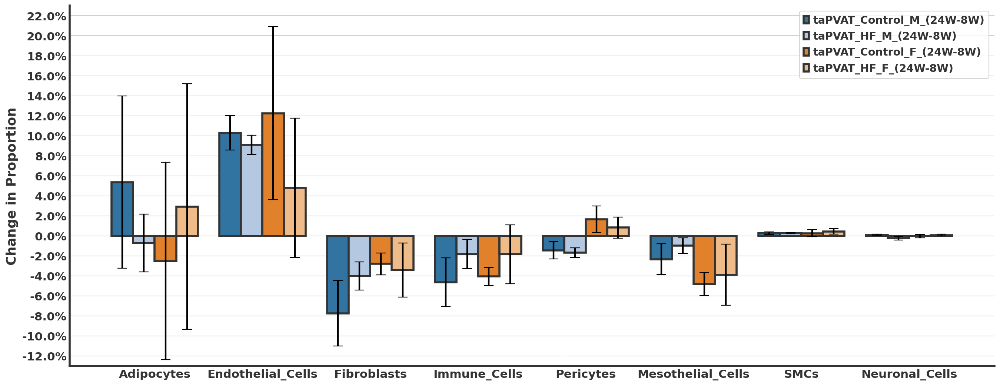

In [16]:
plt.figure(figsize = (20,8))
plt.style.use("seaborn-whitegrid")

group_order = ['taPVAT_Control_M_(24W-8W)','taPVAT_HF_M_(24W-8W)','taPVAT_Control_F_(24W-8W)','taPVAT_HF_F_(24W-8W)']

cell_type_order = ['Adipocytes',  'Endothelial_Cells', 'Fibroblasts', 'Immune_Cells',
                   'Pericytes', 'Mesothelial_Cells',  'SMCs', 'Neuronal_Cells']

df_comb_sorted_1 = df_comb.set_index(['celltype']).loc[cell_type_order].reset_index()
df_comb_sorted = df_comb_sorted_1.set_index(['sample_type']).loc[group_order].reset_index()

ax = sns.barplot(data = df_comb_sorted, x = 'celltype', y = 'prop_diff', capsize = 0.06, edgecolor = '0.2', lw = 2.5, ci = None, 
                palette = 'tab20', hue = 'sample_type', hue_order = group_order)

bars = ax.patches
for bar, ci in zip(bars, df_comb_sorted.se):
    x = bar.get_x() + bar.get_width() / 2  # X-coordinate of the bar's center
    y = bar.get_height()  # Height of the bar
    ax.errorbar(x, y, yerr=ci, capsize=6, linewidth = 2, color='black', fmt='none')

prev_lim = ax.get_ylim()[1]

#max_val = max(vals)

handles, labels = ax.get_legend_handles_labels()

plt.legend(handles[0:], labels[0:], loc = 'upper right', # bbox_to_anchor = (1, 0), 
          ncol = 1, frameon = True, fontsize = 14, labelcolor = '0.2', prop = {'weight': 'bold'})


for axis in ['bottom', 'left']:
    ax.spines[axis].set_linewidth(2.5)
    ax.spines[axis].set_color('0.2')
    
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

#ax.set_yscale('log')
plt.xticks(size = 14, ha = 'center', weight = 'bold', color = '0.2')
plt.yticks(np.arange(-0.14, 0.26, 0.02), size = 14, weight = 'bold', color = '0.2')

ax.tick_params(width = 2.5, color = '0.2')

vals = ax.get_yticks()
ax.set_yticklabels(['{:,.1%}'.format(x) for x in vals])

plt.xlabel('')
plt.ylabel('Change in Proportion', size = 16, color = '0.2', weight = 'bold')

plt.ylim(-0.13, 0.23)


# Collect p-values
p_list = []
i = 0

for celltype in df_comb_sorted.celltype.unique():
    ### Standard Error of the Difference Between Differences
    se_diff = (df_comb_sorted.se[i]**2 + df_comb_sorted.se[i+1]**2)**(0.5)
    t = (df_comb_sorted.prop_diff[i] - df_comb_sorted.prop_diff[i+1])/se_diff ###Control - HF. The order doesn't actually matter because it's a two-sided t-test.
    ### Approximation of the degrees of freedom based on the Welch-Satterthwaite equation.
    dof = np.floor((df_comb_sorted.se[i]**2 + df_comb_sorted.se[i+1]**2)**2 \
                   / ((df_comb_sorted.se[i]**4 / df_comb_sorted.dof[i]) + (df_comb_sorted.se[i+1]**4 / df_comb_sorted.dof[i+1])))
    p_val = stats.t.sf(abs(t), dof) * 2
    p_list.append(p_val)
    i+=2
    
def annotate_graph(ax = ax, label = "label"):
    fontsize = 16
    ax.annotate(label,
               (patch.get_x() + patch.get_width(), ax.get_ylim()[0]), 
               ha='center', va='bottom', 
               fontsize = fontsize,
               weight = 'bold',
               color = 'white',
               xytext=(0, 0), 
               textcoords='offset points')

# Annotate bars with p-values
for p, patch in zip(p_list, ax.patches):
    if p < 0.001: 
        annotate_graph(ax, "***")
    elif p < 0.01:
        annotate_graph(ax, "**")
    elif p < 0.05:
        annotate_graph(ax, "*")
    else:
        annotate_graph(ax, "")
        
plt.savefig('../output/taPVAT_barplot_comparing_diet_differences_over_time_all_samples.svg', bbox_inches = 'tight')
#plt.savefig('../output/barplot.png', bbox_inches = 'tight', dpi = 600, facecolor = ax.get_facecolor())
plt.show()